# Trabajo Práctico

Importar librerías necesarias

In [75]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
from scipy.stats import pearsonr
from sklearn.impute import KNNImputer
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
from sklearn.linear_model import ElasticNetCV
from sklearn import metrics
from sklearn.metrics import r2_score
import warnings
warnings.filterwarnings("ignore")

## 1 - Análisis Exploratorio (EDA)
Se comenzará haciendo un análisis explotarorio del dataset para conocer sus características principales y evaluar si es necesario hacer algún manejo de datos faltantes, outliers, codificar variables categóricas, o algún otro proceso antes de comenzar.


Para esto se hallarán:

-.  Medidas de centralidad

-.  Cuartiles y percentiles

-.  Medidas de dispersión

-.  Valores atípicos

-.  Gráficos de proporciones y porcentajes

-.  Matriz de correlación

-.  Métricas de distancia y similaridad

En esta primera etapa se obtendrá información sobre el dataset y se realizarán gráficos que permitan observar los datos sin realizar modificaciones previas sobre el set de datos, es decir, se analizará el dataset tal como proviene de la fuente.

### 1.1 - Importar el dataset y visualizar el dataframe

In [76]:
weatherAUS_df = pd.read_csv('weatherAUS.csv')

A cerca del dataset:

Este conjunto de datos contiene aproximadamente 10 años de observaciones meteorológicas diarias de distintas ciudades de Australia.

Fuente:

Las observaciones se obtuvieron de numerosas estaciones meteorológicas.

Definiciones adaptadas de http://www.bom.gov.au/climate/dwo/IDCJDW0000.

Fuente de datos: http://www.bom.gov.au/climate/dwo/ y http://www.bom.gov.au/climate/data.

In [77]:
weatherAUS_df

,Unnamed: 0,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,RainfallTomorrow
0,0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,...,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,0.0
1,1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,...,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,0.0
2,2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,...,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,0.0
3,3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,...,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,1.0
4,4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,0.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145407,145454,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,...,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No,0.0
145408,145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,...,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,0.0
145409,145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,...,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,0.0
145410,145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,...,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,0.0


### 1.2 - Filtrar las filas de interés

In [78]:
# Eliminar la columna 'Unnamed: 0' del DataFrame
weatherAUS_df = weatherAUS_df.drop(columns=['Unnamed: 0'])

# Eliminar registros con datos nulos en las variables respuesta 'RainTomorrow' y 'RainfallTomorrow'
weatherAUS_df.dropna(subset=['RainTomorrow', 'RainfallTomorrow'], inplace=True)

# Lista de ubicaciones de interés
ubicaciones_interes = ["Sydney", "SydneyAirport", "Canberra", "Melbourne", "MelbourneAirport"]

# Filtrar las filas en base a las ubicaciones interes
weatherAUS_df = weatherAUS_df[weatherAUS_df['Location'].isin(ubicaciones_interes)]

# Determinación de ciudades
cities = weatherAUS_df.Location.unique()

print(f'Lista de ciudades de interés: {cities}')
print(f'Cantidad de ciudades restantes: {len(cities)}')
print(f'Cantidad de registros {len(weatherAUS_df)}')

Lista de ciudades de interés: ['Sydney' 'SydneyAirport' 'Canberra' 'MelbourneAirport' 'Melbourne']
Cantidad de ciudades restantes: 5
Cantidad de registros 15199


### 1.3 - Conocer las columnas
En este paso se imprime una lista de las columnas con sus respectivos tipos y cantidad de datos.

La descripción de las columnas provista por quien publicó el dataset es la siguiente:

1. Date: Fecha de la observación
2. Location: El nombre común de la ubicación de la estación 1. 1. meteorológica.
3. MinTemp: La temperatura mínima en grados Celsius.
4. MaxTemp: La temperatura máxima en grados Celsius.
5. Rainfall: La cantidad de lluvia registrada durante el día en mm.
6. Evaporation: La denominada evaporación del recipiente de Clase A (mm) en las 24 horas hasta las 9 a.m.
7. Sunshine: El número de horas de sol brillante en el día.
8. WindGustDir: La dirección de la ráfaga de viento más fuerte en las 24 horas hasta la medianoche.
9. WindGustSpeed: La velocidad (km/h) de la ráfaga de viento más fuerte en las 24 horas previas a la medianoche.
10. WinDir9am: Dirección del viento a las 9 a.m.
11. WinDir3pm: Dirección del viento a las 3 p.m.
12. 1. WindSpeed9am: Velocidad del viento (km/h) promediada durante 10 minutos antes de las 9 a.m.
WindSpeed3pm: Velocidad del viento (km/h) promediada durante 10 minutos antes de las 3 p.m.
13. Humidity9am: Humedad (porcentaje) a las 9 a.m.
14. Humidity3pm: Humedad (porcentaje) a las 15:00 horas.
15. Pressure9am: La presión atmosférica (hpa) se redujo al nivel medio del mar a las 9 a.m.
16. Pressure3pm: La presión atmosférica (hpa) se redujo al nivel medio del mar a las 3 p.m.
17. Cloud9am: Fracción del cielo oscurecida por las nubes a las 9:00 horas. Esto se mide en "oktas", que son una unidad de octavos. 1. 1. Registra cuántas octavas partes del cielo están oscurecidas por las nubes. Una medida 0 indica cielo completamente despejado mientras que un 8 indica que está completamente nublado.
18. Cloud3pm: Fracción de cielo oscurecida por nubes (en "oktas": octavos) a las 15.00 horas. Consulte Cload9am para obtener una descripción de los valores.
19. Temp9am: Temperatura (grados C) a las 9 a.m.
20. Temp3pm: Temperatura (grados C) a las 15:00 horas.
21. RainToday: Booleano: 1 si la precipitación (mm) en las 24 horas hasta las 9 a. m. excede 1 mm; de lo contrario, 0.
22. RainTomorrow: Indica si llueve mañana o no.
23. RainfallTomorrow: La cantidad de lluvia del día siguiente en mm.

### 1.4 - Medidas estadísticas y de localización
En este paso se estudian, para cada columna, medidas de localización como mínimo, máximo, cuartiles, y de centralidad como la mediana y la media.

In [79]:
weatherAUS_df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainfallTomorrow
count,15189.000000,15193.000000,15036.000000,13505.000000,13260.000000,13756.000000,14939.000000,14950.000000,15111.000000,15154.000000,14946.000000,14954.000000,13158.000000,12917.000000,15175.000000,15183.000000,15199.000000
mean,11.606057,21.784203,2.299601,4.869108,6.897270,44.323786,16.479617,21.746622,68.884918,51.238683,1018.334022,1016.079898,4.738486,4.735852,15.570662,20.260304,2.302586
std,5.877294,6.055148,7.404618,3.057514,3.836702,14.952565,10.282170,9.529054,15.645965,17.735612,7.398337,7.264708,2.731410,2.593568,5.570913,5.858891,7.385251
min,-8.000000,4.100000,0.000000,0.000000,0.000000,11.000000,0.000000,0.000000,11.000000,3.000000,986.700000,985.500000,0.000000,0.000000,-1.300000,3.700000,0.000000
25%,7.900000,17.200000,0.000000,2.600000,3.800000,33.000000,9.000000,15.000000,59.000000,39.000000,1013.400000,1011.200000,2.000000,2.000000,11.600000,16.000000,0.000000
50%,11.600000,21.300000,0.000000,4.200000,7.600000,43.000000,15.000000,20.000000,70.000000,51.000000,1018.500000,1016.300000,6.000000,6.000000,15.400000,19.800000,0.000000
75%,15.900000,25.800000,0.800000,6.600000,10.000000,54.000000,22.000000,28.000000,80.000000,62.000000,1023.300000,1021.000000,7.000000,7.000000,19.600000,24.200000,0.800000
max,30.500000,46.800000,119.400000,23.800000,13.900000,122.000000,69.000000,76.000000,100.000000,100.000000,1040.600000,1037.900000,9.000000,8.000000,37.200000,46.100000,119.400000


In [80]:
weatherAUS_df[['RainToday', 'RainTomorrow']].describe()

,RainToday,RainTomorrow
count,15036,15199
unique,2,2
top,No,No
freq,11541,11643


Para las columnas analizadas, en general se puede notar que la medida de la media es muy cercana a la mediana indicando que el valor promedio de los datos coincide con el valor central de la distribución. Los desvíos no suelen superar el 25% dando indicio de que la caja de un diagrama de boxplot no sería muy alargada.

Además, los valores mínimos y máximos registrados suelen estar muy alejados de los valores centrales, por lo que se espera presencia de valores atípicos.

Específicamente, en las columnas que representan presión se observa una media, mediana, valor mínimo y máximo muy cercanos. Tiene sentido considerando que se trata de pesión y no se espera gran variabilidad en las mediciones.

### 1.5 - Datos faltantes
Aquí se utiliza otro método de Pandas para ver más claramente la cantidad de datos faltantes

In [81]:
# Identificar la cantidad de filas con datos faltantes para cada columna
missing_data = weatherAUS_df.isnull().sum()
print(missing_data)

Date                   0
Location               0
MinTemp               10
MaxTemp                6
Rainfall             163
Evaporation         1694
Sunshine            1939
WindGustDir         1445
WindGustSpeed       1443
WindDir9am           678
WindDir3pm           289
WindSpeed9am         260
WindSpeed3pm         249
Humidity9am           88
Humidity3pm           45
Pressure9am          253
Pressure3pm          245
Cloud9am            2041
Cloud3pm            2282
Temp9am               24
Temp3pm               16
RainToday            163
RainTomorrow           0
RainfallTomorrow       0
dtype: int64


In [82]:
# Obtener el mayor valor de valores faltantes por columna
max_missing_values = missing_data.max()

# Calcular el porcentaje en relación a la cantidad total de datos
total_rows = weatherAUS_df.shape[0]
percentage_missing = (max_missing_values / total_rows) * 100

print(f"El mayor valor de valores faltantes por columna es {max_missing_values}.")
print(f"La cantidad de registros total en el dataframe es {total_rows }")
print(f"Representa aproximadamente el {percentage_missing:.2f}% de los datos totales.")


El mayor valor de valores faltantes por columna es 2282.
La cantidad de registros total en el dataframe es 15199
Representa aproximadamente el 15.01% de los datos totales.


Este resultado indica que se debe realizar una imputación de datos, debido a que los datos son valiosos y costosos y no se desean descartar más de un 5% de los mismos.

### 1.6 - Visualización de Datos Numéricos


#### 1.6.1 - Gráficos de Caja y Bigotes
Para visualizar la distribución de las varaibles se realizaron gráficos de caja y bigote.

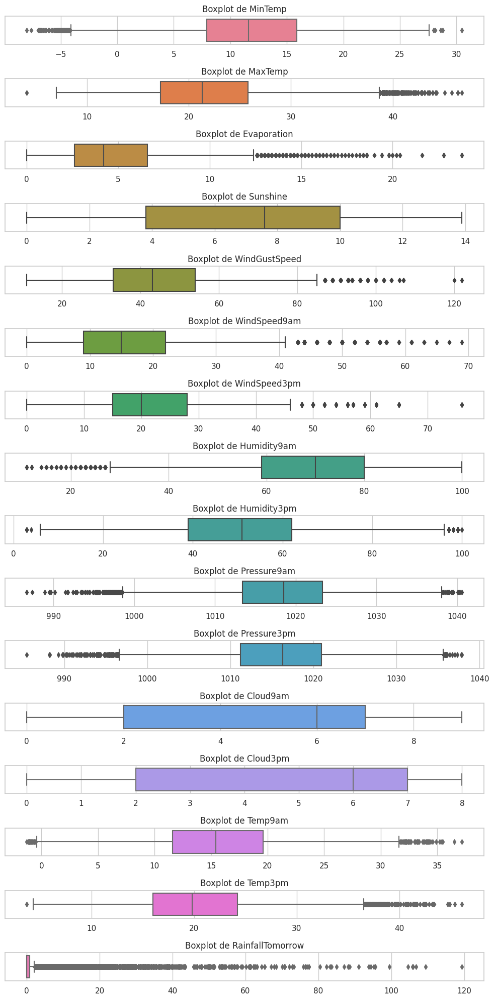

In [83]:
# Columnas numéricas
numeric_columns = [
    'MinTemp', 'MaxTemp', 'Evaporation', 'Sunshine', 'WindGustSpeed',
    'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
    'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainfallTomorrow'
]

# Colores para los boxplots
colors = sns.color_palette('husl', n_colors=len(numeric_columns))

# Crear subplots
fig, axes = plt.subplots(len(numeric_columns), 1, figsize=(10, 20), sharex=False)

# Generar boxplots horizontales para cada columna numérica
for i, col in enumerate(numeric_columns):
    sns.boxplot(data=weatherAUS_df, x=col, ax=axes[i], color=colors[i], orient='h')
    axes[i].set_title(f'Boxplot de {col}')
    axes[i].set_xlabel('')  # Elimina la etiqueta del eje x para mayor claridad

# Ajustar espaciado entre subplots
plt.tight_layout()

# Mostrar los gráficos
plt.show()

En la figura donde se representan los boxplot de las columnas del dataset se observa en la mayoría de las columnas la presencia de valores atípicos. En algunas variables dichos valores se encuentran más alejados. Otras veces se encuentran más cercanos y hacia ambos lados del diagrama.

También se puede notar que hay varibales que no presentan valores atípicos según el cálculo usado por el boxplot para mostrar los mismos (para el límite inferior es es q1 -1.5\*RIC y para el límite superior es q3 + 1.5\*RIC).

Las variables que presentan mayor amplitud en el boxplot, indicando mayor dispersión en los valores de los datos son Sunshine, Cloud9am y Cloud3pm.

#### 1.6.2 - Histogramas
Para visualizar las distribuciones de forma más detallada se realizaron también histogramas de cada una.

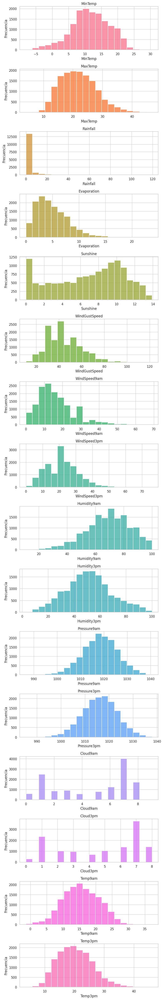

In [84]:
# Seleccionar las columnas numéricas excluyendo "RainfallTomorrow"
numeric_columns = weatherAUS_df.select_dtypes(include=['float64']).drop(columns=['RainfallTomorrow'])

# Configurar el número de subplots y el tamaño de la figura
num_plots = len(numeric_columns.columns)
fig, axes = plt.subplots(num_plots, 1, figsize=(8, num_plots * 3))

# Definir una paleta de colores para Seaborn
color_palette = sns.color_palette("husl", num_plots)

# Crear un histograma para cada columna numérica con colores distintos
for i, column in enumerate(numeric_columns.columns):
    ax = axes[i]
    sns.histplot(weatherAUS_df[column].dropna(), bins=20, color=color_palette[i], ax=ax)
    ax.set_title(column)
    ax.set_xlabel(column)
    ax.set_ylabel('Frecuencia')

# Ajustar espaciado entre subplots
plt.tight_layout()

# Mostrar los histogramas
plt.show()

El gráfico boxplot es útil para visualizar medidas de centralidad y dispersión pero limita al momento de conocer mejor el comportamiento de los datos.

En los gráficos anteriores se puede notar que hay variables cuyos valores se encuentran más homogéneamente distribuidos, tales como los de temperatura, humedad y presión. Otros muestran la presencia de más de una moda en los datos y una distribución menos ordenada.

Ahora se confirma lo que se había obeservado en los box plots de que sunshine se desitribuye más dispersamente que las demás. Pero también se obserba que las Cloud que también parecían dispersas se muestran bimodales en lso valores de 1 y 7. Además se confirma que Rainfall tiene la inmensa mayoría de sus datos concentradas en cero.


### 1.7 - Correlación entre variables

#### 1.7.1 - Gráfico de pares

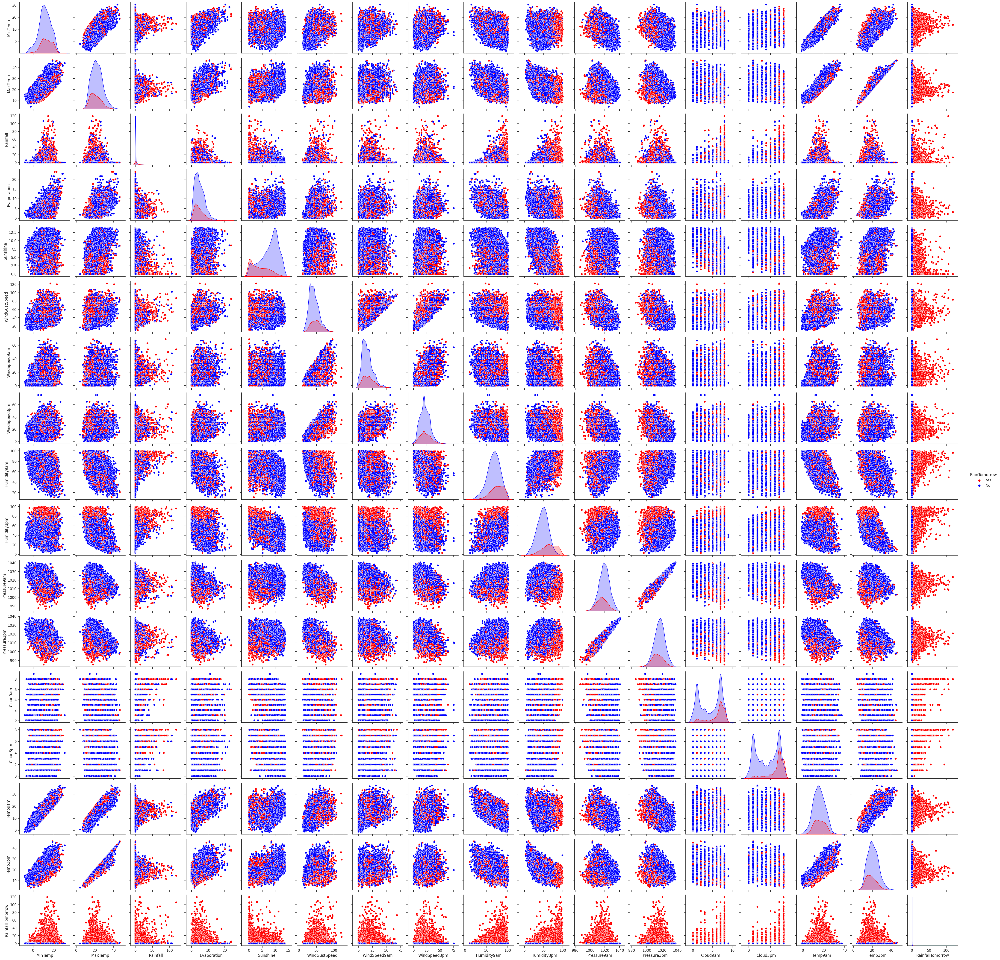

In [85]:
# Seleccionar las columnas numéricas
numeric_columns = weatherAUS_df.select_dtypes(include=['float64'])

# Agregar la columna 'RainTomorrow' al DataFrame de columnas numéricas
numeric_columns['RainTomorrow'] = weatherAUS_df['RainTomorrow']

# Crear el pairplot
sns.set(style="ticks")
sns.pairplot(numeric_columns, diag_kind='kde', hue='RainTomorrow', palette={"Yes": "red", "No": "blue"})
plt.show()

Se observan pares de variables altamente correlacionadas, que luego deberán ser analizadas para evitar la multicolinealidad.

#### 1.7.2 - Matriz de correlación

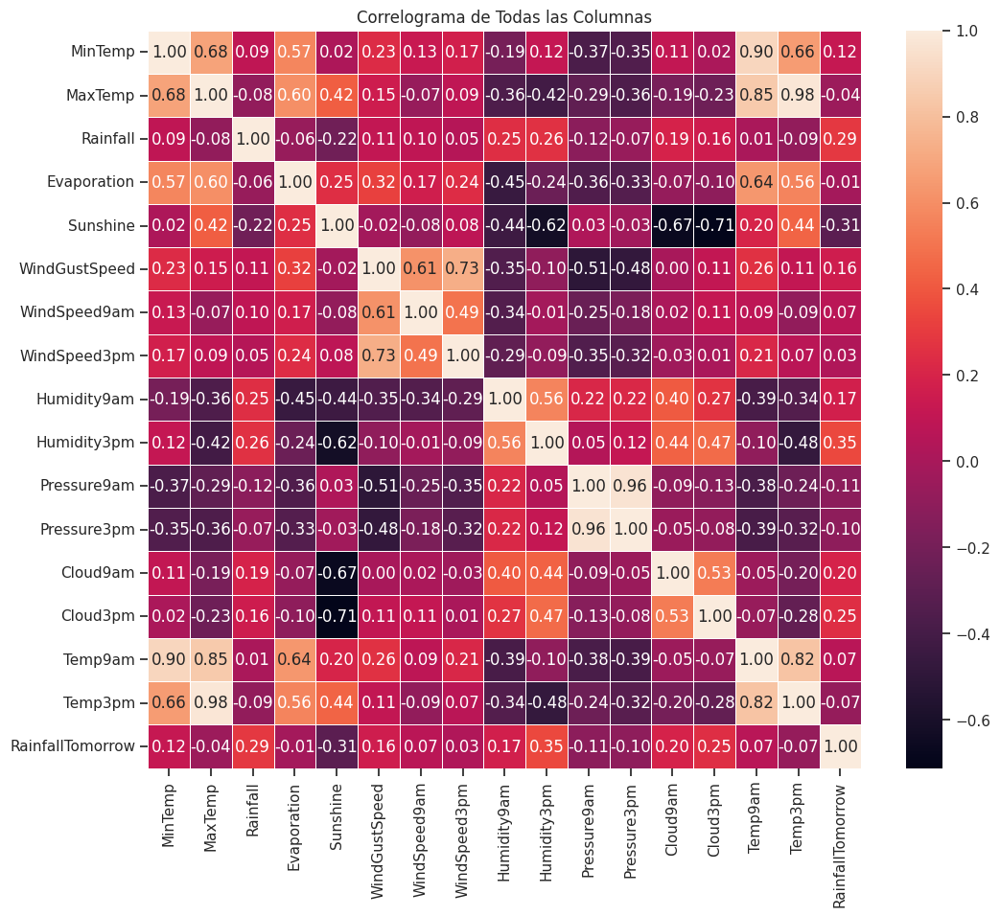

In [86]:
# Calcular la matriz de correlación
correlation_matrix = weatherAUS_df.corr()

# Crear un mapa de calor (correlograma)
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='rocket', annot=True, fmt=".2f", linewidths=0.5)
plt.title('Correlograma de Todas las Columnas')
plt.show()

Se realiza la matriz de correlación ya que permite ver de forma rápida si existe alguna relación lineal entre las variables. Un valor de 1 indica una relación lineal positiva perfecta, un valor de -1 indica una relación lineal negativa perfecta y un valor de 0 indica que no hay relación lineal entre las variables. Esto facilita la identificación y comparación de las relaciones más fuertes y débiles entre pares de variables en un conjunto de datos.

#### 1.7.3 - Graficos de dispersión de variables altamente correlacionadas (>0.6)
Se grafican scatterplots de variables correlacionadas con el fin de visualizar mejor la distribución de los datos en los ejes.

In [87]:
# Calcular la matriz de correlación
correlation_matrix = weatherAUS_df.corr(numeric_only=True)

# Definir el umbral de correlación
umbral = 0.65

# Encontrar pares de columnas con correlaciones fuera del umbral
high_corr_pairs = []

for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) >= umbral:
            high_corr_pairs.append((correlation_matrix.columns[i], correlation_matrix.columns[j], correlation_matrix.iloc[i, j]))

# Imprimir pares de columnas y sus correlaciones, y crear el diccionario
dict_alta_correlacion = {}

for col1, col2, corr in high_corr_pairs:
    print(f"{col1} - {col2}: {corr}")
    dict_alta_correlacion[(col1, col2)] = corr

MinTemp - MaxTemp: 0.6819586972964039
MinTemp - Temp9am: 0.9047258001426239
MinTemp - Temp3pm: 0.6553322955403232
MaxTemp - Temp9am: 0.851056003914405
MaxTemp - Temp3pm: 0.9769998586211556
Sunshine - Cloud9am: -0.6684332865559546
Sunshine - Cloud3pm: -0.7126793122256663
WindGustSpeed - WindSpeed3pm: 0.7303747216201067
Pressure9am - Pressure3pm: 0.9599908564377785
Temp9am - Temp3pm: 0.819626868399499


<Figure size 1200x800 with 0 Axes>

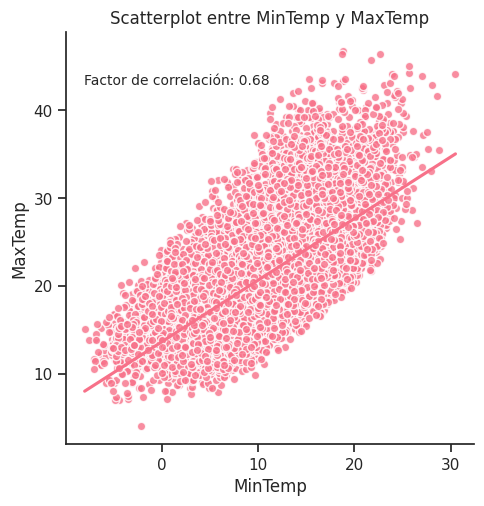

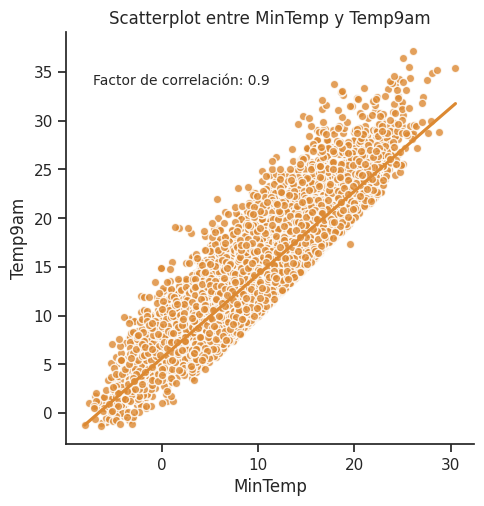

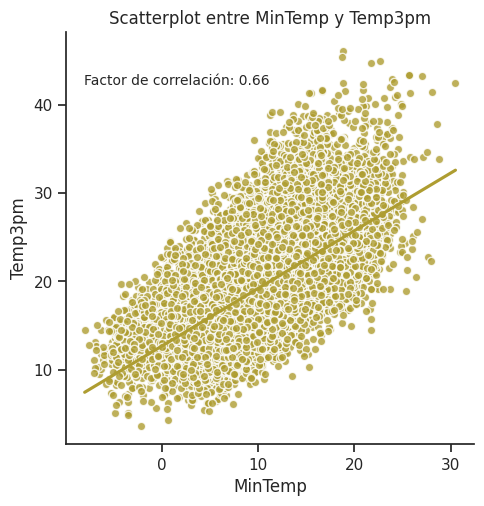

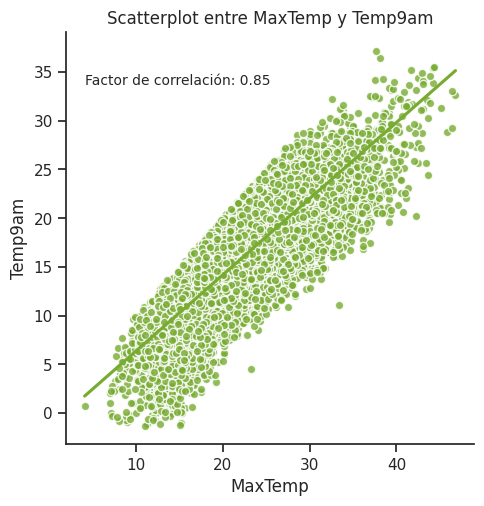

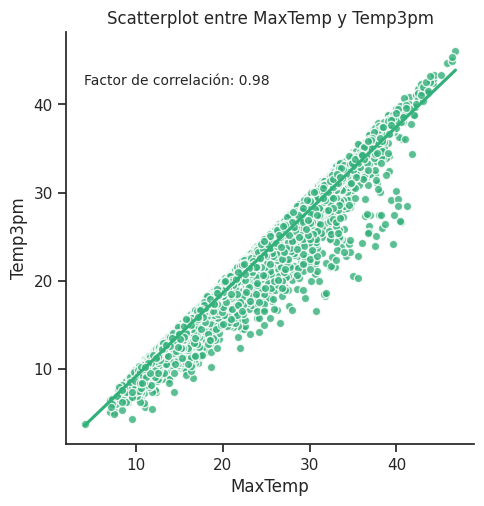

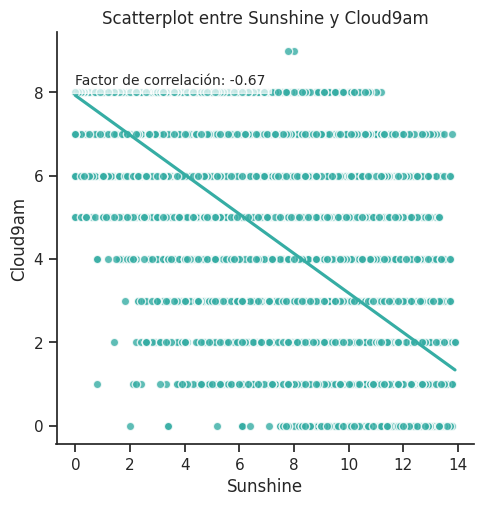

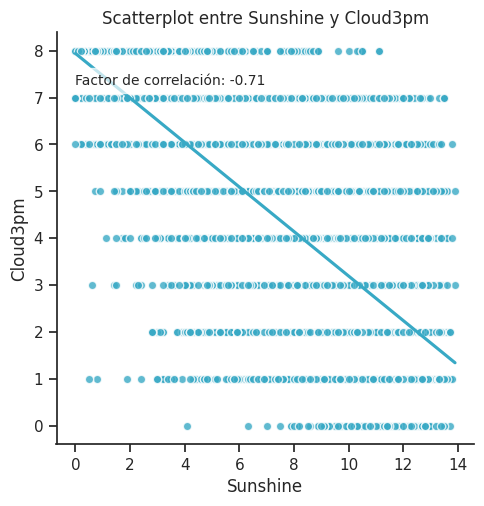

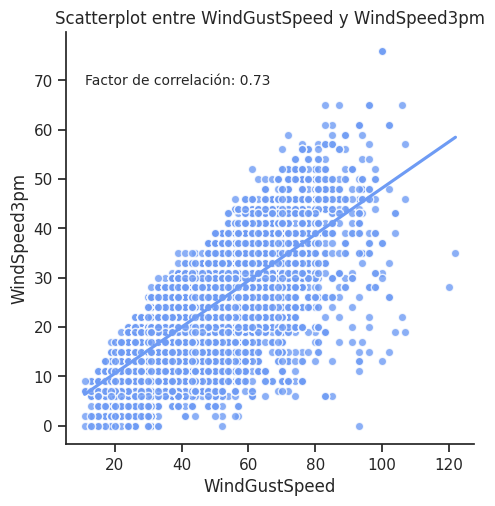

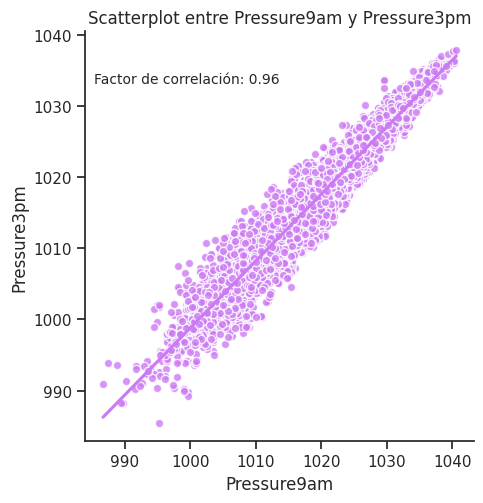

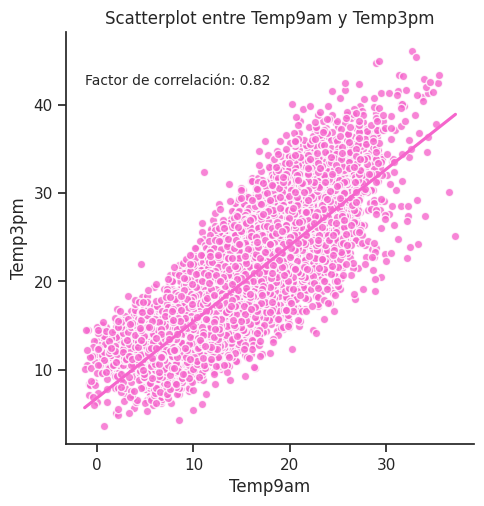

In [88]:
# Crea una figura para los gráficos
plt.figure(figsize=(12, 8))

# Itera a través de los pares de alta correlación
for i, (col1, col2, corr) in enumerate(high_corr_pairs):
    # Crea un gráfico de dispersión con regresión lineal
    sns.lmplot(data=weatherAUS_df, x=col1, y=col2, ci=None,
               scatter_kws={"color": sns.color_palette("husl", n_colors=len(high_corr_pairs))[i],
                            "edgecolor": "white"},
               line_kws={"color": sns.color_palette("husl", n_colors=len(high_corr_pairs))[i]})
    plt.title(f'Scatterplot entre {col1} y {col2}')
    plt.text(0.5, 0.9, f'Factor de correlación: {round(corr, 2)}', horizontalalignment='right', verticalalignment='top', transform=plt.gca().transAxes, fontsize=10, bbox=dict(facecolor='white', alpha=0.7))

# Muestra los gráficos
plt.show()

Al realizar los scatterplots se reconoce más claramente que algunas variables explicativas tienen un comportamiento lineal casi perfecto, mientras otras tienen mayor dispersión o es la distribución de los puntos hace menos claro imaginar una recta que los represente.

### 1.8 - Variables respuesta

#### 1.8.1 - Balance de Datos
A continuación se muestra la proporción de datos en las cuales la variable objetivo indican que llovió y las que no llovió.

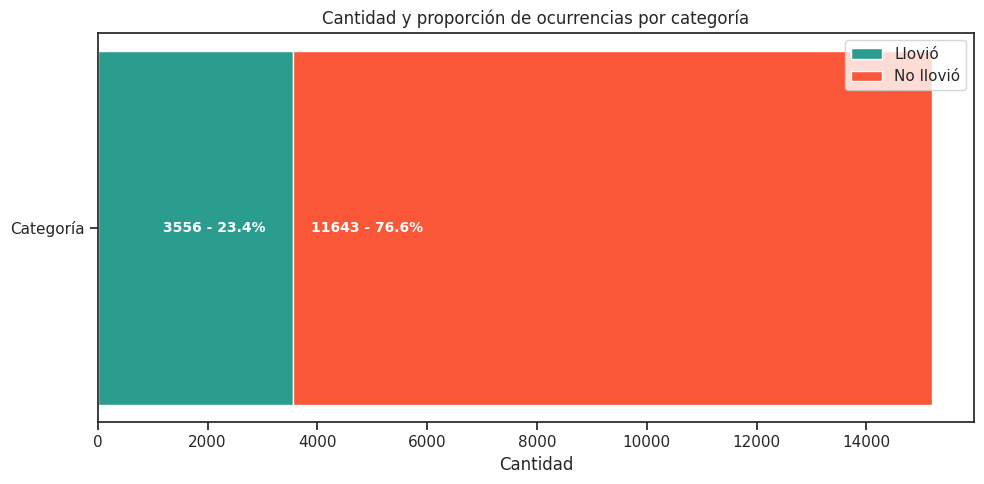

In [89]:
# Datos
rainfall_values = ['Llovió', 'No llovió']
llovio = weatherAUS_df[weatherAUS_df['RainTomorrow'] == 'Yes']['RainTomorrow'].count()
no_llovio = weatherAUS_df[weatherAUS_df['RainTomorrow'] == 'No']['RainTomorrow'].count()
total = llovio + no_llovio
amount = [llovio, no_llovio]
colors = ['#2a9d8f', '#f95738']

# Configuración de la figura
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

# Función para apilar
def apilar_amount(amount, index):
  if index == 0:
    return 0
  else:
    return sum(amount[:index])

for i, value in enumerate(rainfall_values):
   # Crear la barra
    bar = ax.barh('Categoría', amount[i], left=apilar_amount(amount, i), color=colors[i], label=value)

    # Añadir el valor de la barra
    for b in bar:
        width = b.get_width()
        plt.text(width/3, b.get_y() + b.get_height()/2, f'{amount[i]} - {round((amount[i]/total)*100, 2)}%', va='center', ha='left', fontsize=10, color='white', fontweight='bold')
        print()
    ax.set_title('Cantidad y proporción de ocurrencias por categoría')
    ax.set_xlabel('Cantidad')
    ax.legend()
# Mostrar gráfico
plt.tight_layout()
plt.show()

El dataset no está balanceado, teniendo un 76.6% de casos de no lluvia y 23.4% de casos de lluvia.

#### 1.8.2 - Relación de las variables explicativas respecto a la variable respuesta RainTomorrow

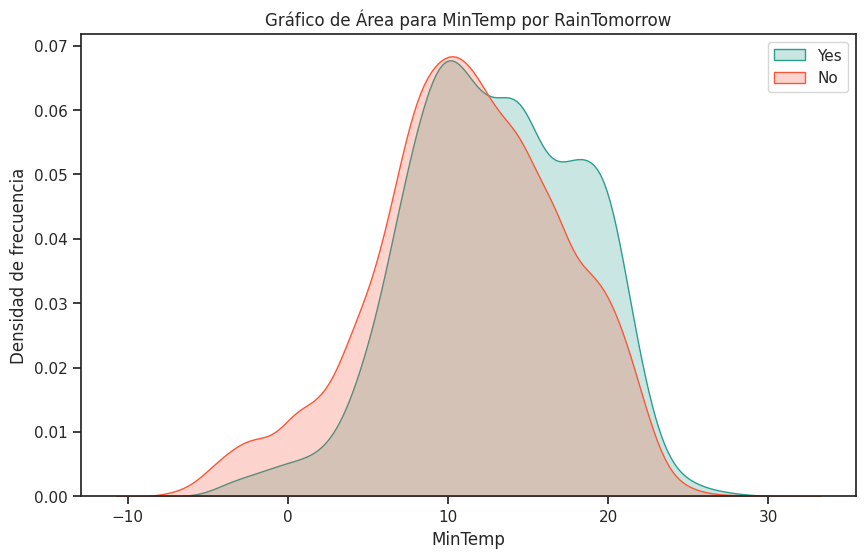

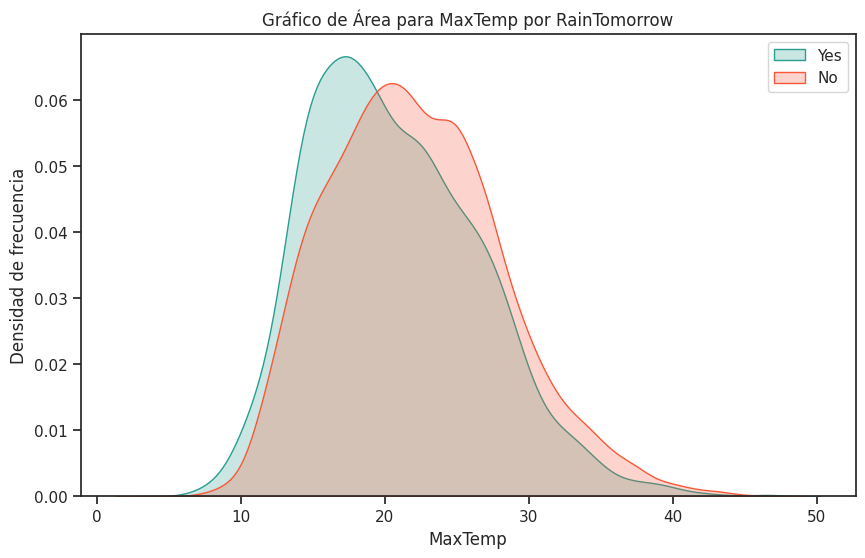

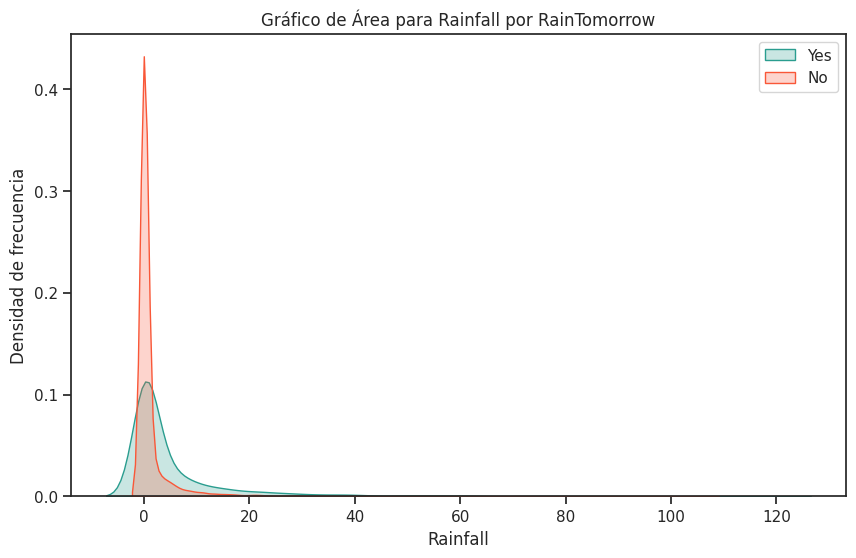

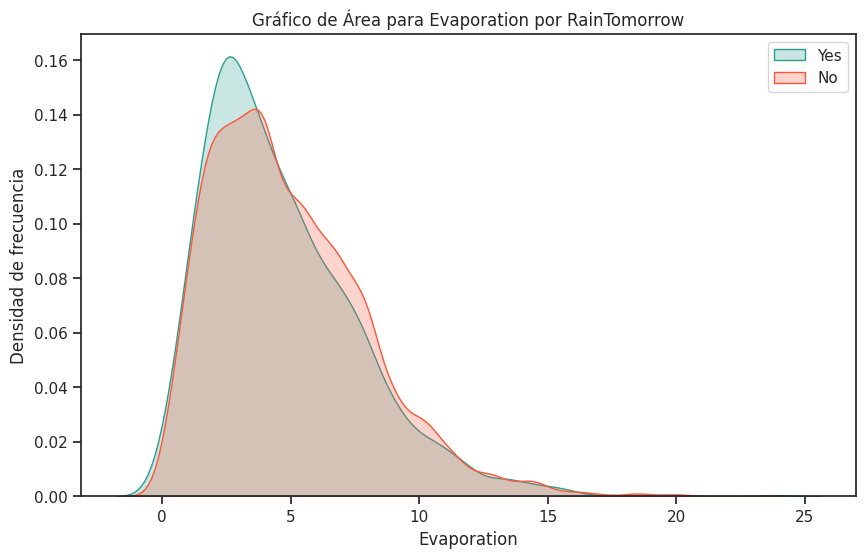

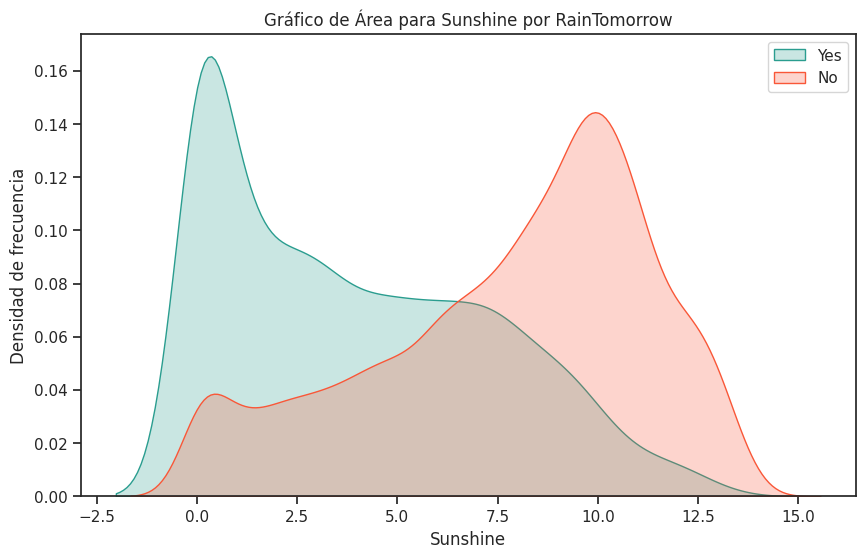

...

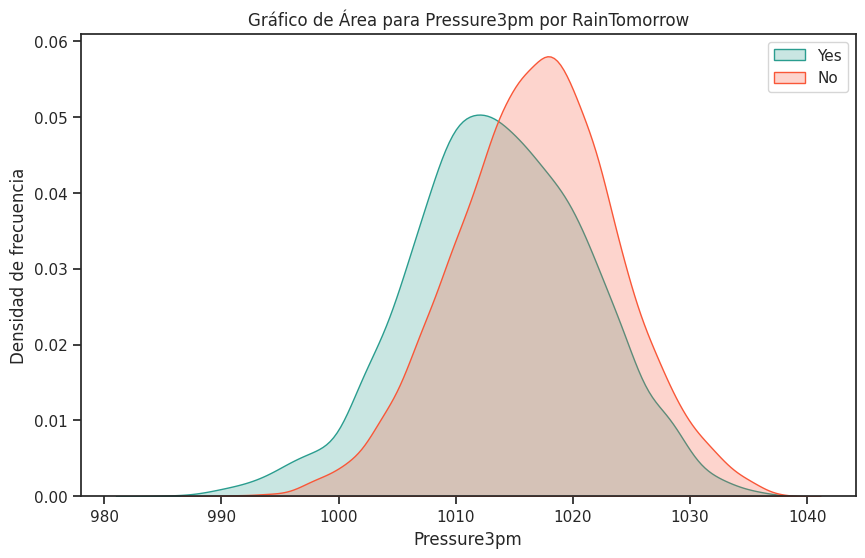

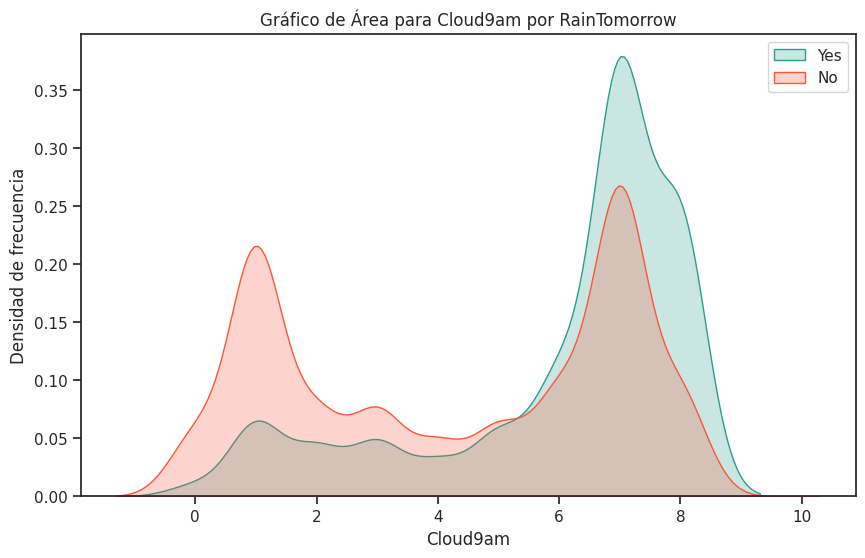

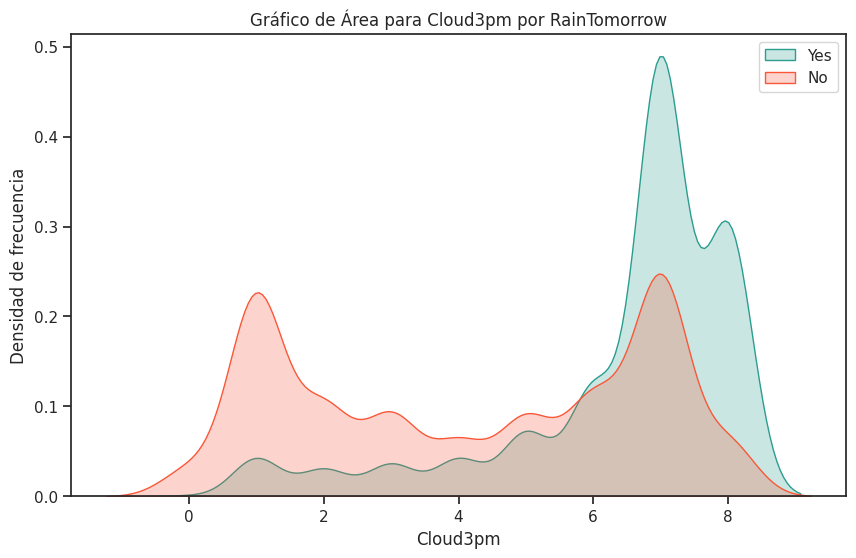

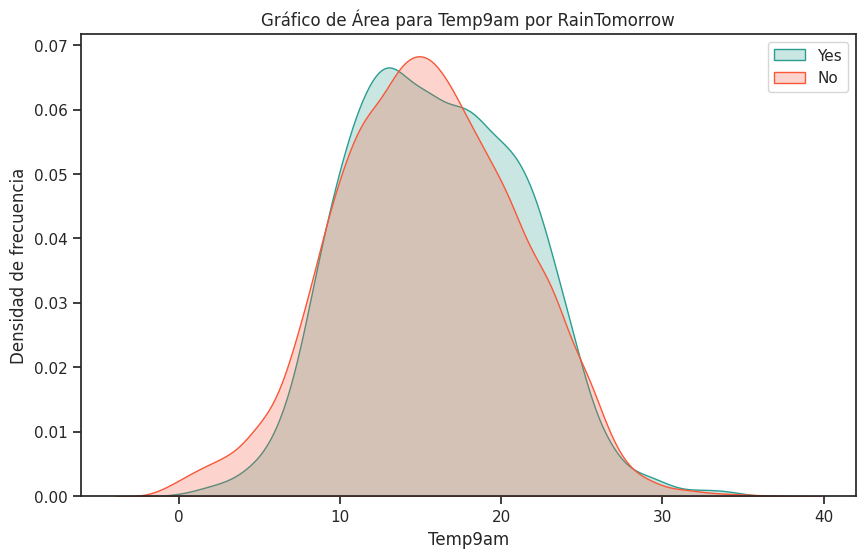

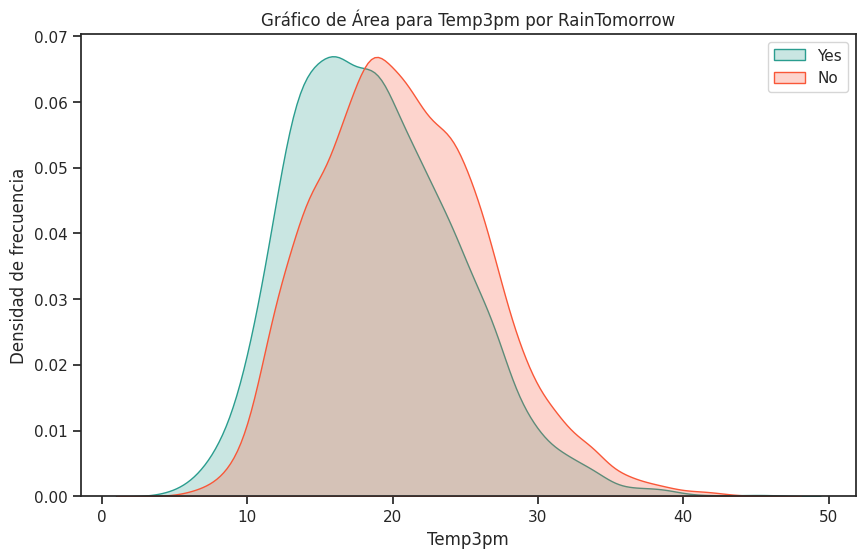

In [90]:
# Crear gráficos de área superpuestos para cada columna numérica
for column in numeric_columns:
    # Omitir la variable 'RainfallTomorrow' y 'RainTomorrow'
    if column == 'RainfallTomorrow' or column == 'RainTomorrow':
        continue

    plt.figure(figsize=(10, 6))

    # Convertir la columna al tipo de datos numérico
    numeric_column = pd.to_numeric(weatherAUS_df[column], errors='coerce')

    # Gráfico de área para "Yes"
    sns.kdeplot(data=numeric_column[weatherAUS_df['RainTomorrow'] == 'Yes'], label='Yes', shade=True, color='#2a9d8f')

    # Gráfico de área para "No"
    sns.kdeplot(data=numeric_column[weatherAUS_df['RainTomorrow'] == 'No'], label='No', shade=True, color='#f95738')

    plt.title(f'Gráfico de Área para {column} por RainTomorrow')
    plt.xlabel(column)
    plt.ylabel('Densidad de frecuencia')
    plt.legend()  # Agregar leyenda

    # Mostrar el gráfico
    plt.show()


#### 1.8.3 - Distribución de RainfallTomorrow

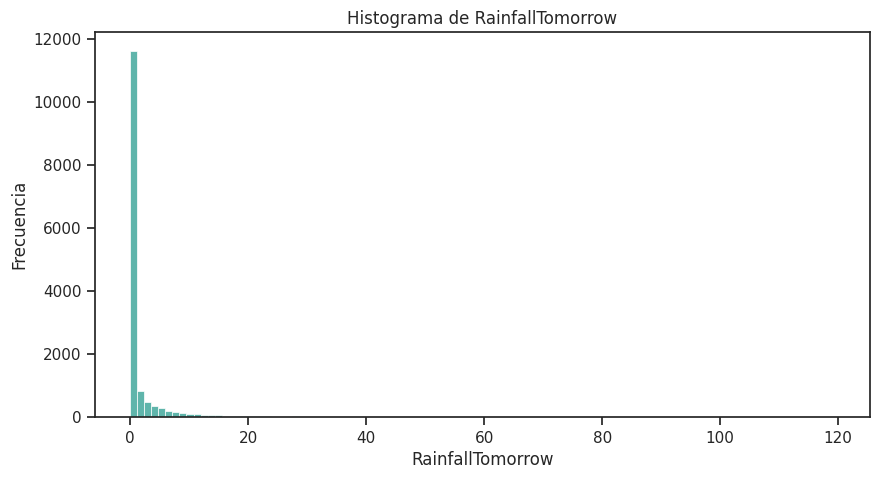

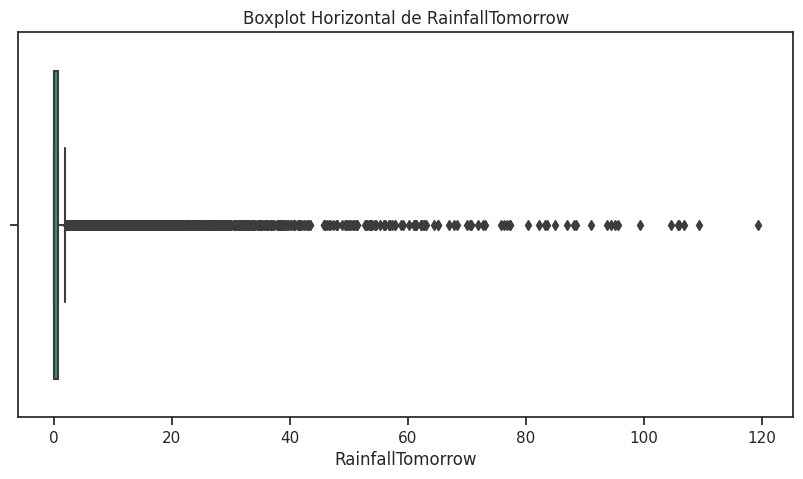

In [91]:
# Crear un histograma para la columna 'RainfallTomorrow'
plt.figure(figsize=(10, 5))
sns.histplot(data=weatherAUS_df, x='RainfallTomorrow', bins=100, color='#2a9d8f')
plt.title('Histograma de RainfallTomorrow')
plt.xlabel('RainfallTomorrow')
plt.ylabel('Frecuencia')

# Mostrar el histograma
plt.show()

# Crear un boxplot horizontal para la columna 'RainfallTomorrow'
plt.figure(figsize=(10, 5))
sns.boxplot(data=weatherAUS_df, x='RainfallTomorrow', color='#2a9d8f', orient='h')
plt.title('Boxplot Horizontal de RainfallTomorrow')
plt.xlabel('RainfallTomorrow')

# Mostrar el boxplot horizontal
plt.show()

El histograma muestra que la gran mayoría de los valores en mm son 0 o están muy cercanos a él. La asimetría en la distribución de los datos puede afectar la capacidad de un modelo de regresión lineal para hacer predicciones precisas. Si existen valores extremos o atípicos en la parte superior de la distribución, pueden tener una influencia desproporcionada en los coeficientes del modelo y aumentar el error cuadrático medio (MSE) del modelo.

#### 1.8.4 - Relación de las variables explicativas respecto a la variable objetivo RainfallTomorrow

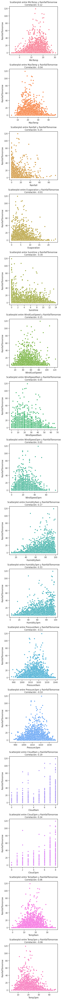

In [92]:
# Selecciona las columnas numéricas
numeric_columns = weatherAUS_df.select_dtypes(include=['float64'])

# Añade la columna 'RainfallTomorrow' al DataFrame de columnas numéricas
numeric_columns['RainfallTomorrow'] = weatherAUS_df['RainfallTomorrow']

# Elimina filas con valores NaN
numeric_columns = numeric_columns.dropna()

# Configura el número de subplots y el tamaño de la figura
num_plots = len(numeric_columns.columns) - 1  # Excluye la columna 'RainfallTomorrow'
fig, axes = plt.subplots(num_plots, 1, figsize=(5, num_plots * 5))

# Genera una paleta de colores con suficientes colores
colors = sns.color_palette("husl", num_plots)

# Crear un diccionario para almacenar las correlaciones
corr_RFT = {}

# Crea scatterplots para cada columna numérica con 'RainfallTomorrow'
for i, column in enumerate(numeric_columns.columns[:-1]):  # Excluye la columna 'RainfallTomorrow'
    ax = axes[i]

    # Calcula el coeficiente de correlación lineal
    corr_coefficient, _ = pearsonr(numeric_columns[column], numeric_columns['RainfallTomorrow'])

    corr_RFT[column] = corr_coefficient  # Guarda la correlación en el diccionario

    sns.scatterplot(data=numeric_columns, x=column, y='RainfallTomorrow', ax=ax, color=colors[i])
    ax.set_title(f'Scatterplot entre {column} y RainfallTomorrow\nCorrelación: {corr_coefficient:.2f}')
    ax.set_xlabel(column)
    ax.set_ylabel('RainfallTomorrow')

# Ajusta el espaciado entre subplots
plt.tight_layout()

# Muestra los scatterplots
plt.show()

Puede observarse que la mayor parte de las variables explicativas están debilmente correlacionadas con la variable objetivo. Cuando esto sucede es probable que un modelo de regresión lineal tenga dificultades para explicar las variaciones en la variable objetivo.

A continuación se muestran los coeficientes de correlación de Pearson entre las variables explicativas numéricas y la varaible objetivo.

#### 1.8.5 - Coeficiente de correlación de Pearson entre variables explicativas numéricas y variable objetivo.

In [93]:
# Imprime el diccionario de correlaciones
print("Correlaciones con RainfallTomorrow:")
for column, corr_coefficient in corr_RFT.items():
    print(f"{column}: {corr_coefficient:.2f}")

Correlaciones con RainfallTomorrow:
MinTemp: 0.12
MaxTemp: -0.04
Rainfall: 0.25
Evaporation: -0.01
Sunshine: -0.30
WindGustSpeed: 0.15
WindSpeed9am: 0.05
WindSpeed3pm: 0.02
Humidity9am: 0.17
Humidity3pm: 0.33
Pressure9am: -0.11
Pressure3pm: -0.10
Cloud9am: 0.19
Cloud3pm: 0.24
Temp9am: 0.06
Temp3pm: -0.06


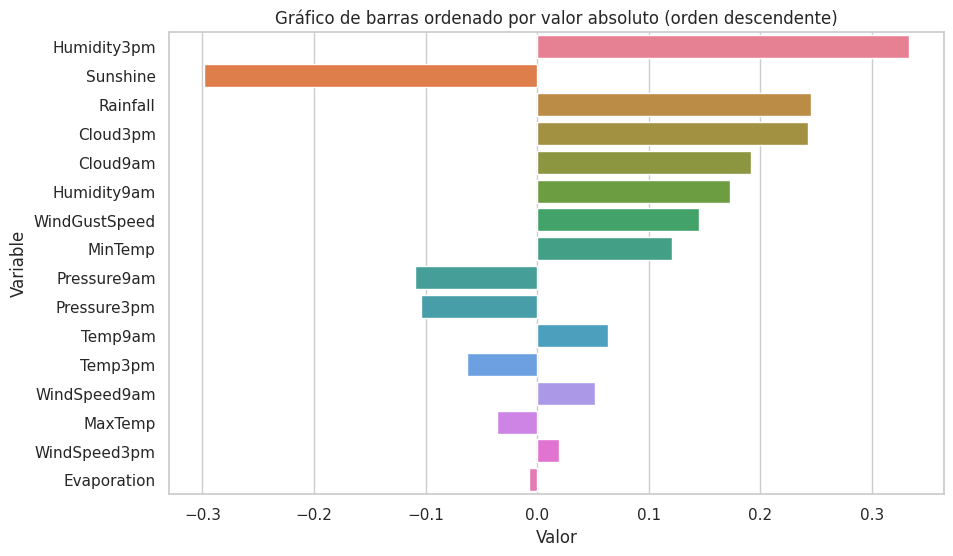

In [94]:
# Ordenar el diccionario por el valor absoluto en orden descendente
sorted_data = dict(sorted(corr_RFT.items(), key=lambda x: abs(x[1]), reverse=True))

# Extraer claves y valores ordenados
keys = list(sorted_data.keys())
values = list(sorted_data.values())

# Crear el gráfico de barras con Seaborn y la paleta de colores "husl"
sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x=values, y=keys, palette="husl")
plt.xlabel('Valor')
plt.ylabel('Variable')
plt.title('Gráfico de barras ordenado por valor absoluto (orden descendente)')
plt.show()

## 2 - Procesamiento de datos

### 2.1 - Imputación de Datos

Cantidad de datos faltantes por columna

In [95]:
# Datos faltantes antes
missing_data = weatherAUS_df.isnull().sum()
print("Datos faltantes por columnas: ")
print(missing_data)

Datos faltantes por columnas: 
Date                   0
Location               0
MinTemp               10
MaxTemp                6
Rainfall             163
Evaporation         1694
Sunshine            1939
WindGustDir         1445
WindGustSpeed       1443
WindDir9am           678
WindDir3pm           289
WindSpeed9am         260
WindSpeed3pm         249
Humidity9am           88
Humidity3pm           45
Pressure9am          253
Pressure3pm          245
Cloud9am            2041
Cloud3pm            2282
Temp9am               24
Temp3pm               16
RainToday            163
RainTomorrow           0
RainfallTomorrow       0
dtype: int64


#### 2.1.1 - Imputar columnas numéricas utilizando K-Nearest Neighbors (K-NN)


El método de imputación de KNN (K-Nearest Neighbors) de scikit-learn es una técnica de imputación que se basa en el principio de que los valores faltantes en un conjunto de datos pueden ser estimados utilizando los valores de los vecinos más cercanos en función de la distancia entre las observaciones

La función funciona de la siguiente manera:

1. Para cada valor faltante en el conjunto de datos, se encuentra la distancia entre esa observación y todas las demás observaciones en el conjunto de datos.

2. Se seleccionan las k (parámetro de la función)observaciones más cercanas (vecinos) a la observación con datos faltantes en función de la distancia calculada.

3. Se utiliza la información de los valores de las k observaciones vecinas para estimar el valor faltante. En scikit-learn, el método KNNImputer para imputación de valores faltantes utiliza el promedio ponderado de los k vecinos más cercanos para estimar el valor faltante.

4. El valor estimado se imputa en lugar del valor faltante en el conjunto de datos.

In [96]:
# Obtener columnas numéricas con datos faltantes
columnas_numericas_con_faltantes = list(weatherAUS_df.select_dtypes(include=['float64']).columns[weatherAUS_df.select_dtypes(include=['float64']).isnull().any()])

# Crea una instancia del imputador K-NN con el número deseado de vecinos (neighbors)
knn_imputer = KNNImputer(n_neighbors=5)

# Aplica el imputador a las columnas seleccionadas
weatherAUS_df[columnas_numericas_con_faltantes] = knn_imputer.fit_transform(weatherAUS_df[columnas_numericas_con_faltantes])

# Datos faltantes antes
missing_data = weatherAUS_df.isnull().sum()
print("Datos faltantes por columna luego de la imputación:")
print(missing_data)

Datos faltantes por columna luego de la imputación:
Date                   0
Location               0
MinTemp                0
MaxTemp                0
Rainfall               0
Evaporation            0
Sunshine               0
WindGustDir         1445
WindGustSpeed          0
WindDir9am           678
WindDir3pm           289
WindSpeed9am           0
WindSpeed3pm           0
Humidity9am            0
Humidity3pm            0
Pressure9am            0
Pressure3pm            0
Cloud9am               0
Cloud3pm               0
Temp9am                0
Temp3pm                0
RainToday            163
RainTomorrow           0
RainfallTomorrow       0
dtype: int64


#### 2.1.2 - Imputar datos de distintas horas de un mismo día
WinDir9am, WinDir3pm, son mediciones de la misma magnitud física pero a distintas horas del día. Teniendo en cuenta que no varían demasiado en un mismo día, se tomará como aproximación de que se mantienen constantes.

In [97]:
# Primero, reemplazamos los valores faltantes en 'WindDir9am' con los de 'WindDir3pm'
weatherAUS_df['WindDir9am'].fillna(weatherAUS_df['WindDir3pm'], inplace=True)

# Luego, reemplazamos los valores faltantes en 'WindDir3pm' con los de 'WindDir9am'
weatherAUS_df['WindDir3pm'].fillna(weatherAUS_df['WindDir9am'], inplace=True)

# Datos faltantes antes
missing_data = weatherAUS_df.isnull().sum()
print("Datos faltantes por columna luego de la imputación:")
print(missing_data)

Datos faltantes por columna luego de la imputación:
Date                   0
Location               0
MinTemp                0
MaxTemp                0
Rainfall               0
Evaporation            0
Sunshine               0
WindGustDir         1445
WindGustSpeed          0
WindDir9am           241
WindDir3pm           241
WindSpeed9am           0
WindSpeed3pm           0
Humidity9am            0
Humidity3pm            0
Pressure9am            0
Pressure3pm            0
Cloud9am               0
Cloud3pm               0
Temp9am                0
Temp3pm                0
RainToday            163
RainTomorrow           0
RainfallTomorrow       0
dtype: int64


#### 2.1.3 - Imputar máximos
Según la descripción de las columnas, hay magnitudes que son resumen de otros valores del mismo día.

WindGustDir es la dirección de la ráfaga de viento más fuerte en las 24 horas hasta la medianoche.

Por lo que si se cuentan con los datos en los demás datos de viento, pueden imputarse con un intervalo de certidumbre aceptable.


In [98]:
# Imputación de 'WindGustDir' y 'WindGustSpeed'
for index, row in weatherAUS_df.iterrows():
    if row['WindSpeed9am'] >= row['WindSpeed3pm']:
        weatherAUS_df.at[index, 'WindGustDir'] = row['WindDir9am']
    else:
        weatherAUS_df.at[index, 'WindGustDir'] = row['WindDir3pm']

# Datos faltantes luego de la imputación
missing_data = weatherAUS_df.isnull().sum()
print("Datos faltantes por columna luego de la imputación:")
print(missing_data)

Datos faltantes por columna luego de la imputación:
Date                  0
Location              0
MinTemp               0
MaxTemp               0
Rainfall              0
Evaporation           0
Sunshine              0
WindGustDir         241
WindGustSpeed         0
WindDir9am          241
WindDir3pm          241
WindSpeed9am          0
WindSpeed3pm          0
Humidity9am           0
Humidity3pm           0
Pressure9am           0
Pressure3pm           0
Cloud9am              0
Cloud3pm              0
Temp9am               0
Temp3pm               0
RainToday           163
RainTomorrow          0
RainfallTomorrow      0
dtype: int64


#### 2.1.6 - Imputar datos de RainToday
Ya que no hay datos faltantes en la columna Ranfall, se imputan los datos a RainToday utilizando el umbral para determinar si se considera o no lluvia con esta información.

In [99]:
variables_respuesta_ordenadas = weatherAUS_df[weatherAUS_df['RainToday'] == 'Yes'][['RainToday', 'Rainfall']].sort_values(by='Rainfall')

variables_respuesta_ordenadas

,RainToday,Rainfall
64343,Yes,1.2
31646,Yes,1.2
46551,Yes,1.2
64455,Yes,1.2
68961,Yes,1.2
...,...,...
32715,Yes,105.8
34318,Yes,106.0
35534,Yes,106.8
31634,Yes,109.4


Aquí puede verse que se considera lluvia a partir de 1.2 mm en la columna Rainfall. Luego se procede a imputar de la siguiente manera:

In [100]:
# Imputar los datos
weatherAUS_df['RainToday'] = weatherAUS_df.apply(lambda row: 'Yes' if row['Rainfall'] >= 1.2 else 'No' if pd.isna(row['RainToday']) else row['RainToday'], axis=1)

# Datos faltantes luego de la imputación
missing_data = weatherAUS_df.isnull().sum()
print("Datos faltantes por columna luego de la imputación:")
print(missing_data)

Datos faltantes por columna luego de la imputación:
Date                  0
Location              0
MinTemp               0
MaxTemp               0
Rainfall              0
Evaporation           0
Sunshine              0
WindGustDir         241
WindGustSpeed         0
WindDir9am          241
WindDir3pm          241
WindSpeed9am          0
WindSpeed3pm          0
Humidity9am           0
Humidity3pm           0
Pressure9am           0
Pressure3pm           0
Cloud9am              0
Cloud3pm              0
Temp9am               0
Temp3pm               0
RainToday             0
RainTomorrow          0
RainfallTomorrow      0
dtype: int64


2.1.7 - Datos faltantes luego de la imputación

In [101]:
# Obtener el mayor valor de valores faltantes por columna
max_missing_values = missing_data.max()

# Calcular el porcentaje en relación a la cantidad total de datos
total_data_points = weatherAUS_df.shape[0]
percentage_missing = (max_missing_values / total_data_points) * 100

print(f"El mayor valor de valores faltantes por columna es {max_missing_values}.")
print(f"La cantidad de registros total en el dataframe es {total_data_points }")
print(f"Representa aproximadamente el {percentage_missing:.2f}% de los datos totales.")

El mayor valor de valores faltantes por columna es 241.
La cantidad de registros total en el dataframe es 15199
Representa aproximadamente el 1.59% de los datos totales.


Los datos faltantes luego de las imputaciones representan el 1.59%, que es inferior al 5% aceptable, por lo que se procederá a eliminar los registros restantes con datos faltantes.

### 2.2 - Eliminación de datos que no fueron imputados.

In [102]:
# Elimina todos los registros con datos faltantes
weatherAUS_LR = weatherAUS_df.dropna()

# Datos faltantes luego de la imputación
missing_data = weatherAUS_LR.isnull().sum()
print("Datos faltantes por columna luego de la eliminación:")
print(missing_data)

Datos faltantes por columna luego de la eliminación:
Date                0
Location            0
MinTemp             0
MaxTemp             0
Rainfall            0
Evaporation         0
Sunshine            0
WindGustDir         0
WindGustSpeed       0
WindDir9am          0
WindDir3pm          0
WindSpeed9am        0
WindSpeed3pm        0
Humidity9am         0
Humidity3pm         0
Pressure9am         0
Pressure3pm         0
Cloud9am            0
Cloud3pm            0
Temp9am             0
Temp3pm             0
RainToday           0
RainTomorrow        0
RainfallTomorrow    0
dtype: int64


### 2.3 - Codificación de variables categóricas

#### 2.3.1 - Codificar la fecha
La zona de estudio es el sur de Australia, como en todas las geografías, allí hay meses húmedos y secos. Teniendo esto en cuenta se creará una nueva variable llamada "wet_month" y tendrá el valor de 1 si la fecha corresponde a la temporada húmeda (de Mayo a Octubre) y 0 si no lo hace. Luego se elimiará la variable "Date".

In [103]:
# Convertir la columna 'Date' a formato datetime
weatherAUS_LR['Date'] = pd.to_datetime(weatherAUS_LR['Date'])

# Definir una función para codificar los meses
def codificar_mes(mes):
    if 5 <= mes.month <= 10:
        return 1
    else:
        return 0

# Aplicar la función a la columna 'Date' y crear una nueva columna 'wet_month'
weatherAUS_LR['wet_month'] = weatherAUS_LR['Date'].apply(codificar_mes)

# Eliminar la columna 'Date' original si ya no la necesitas
weatherAUS_LR.drop(columns=['Date'], inplace=True)

# Cantidad de características (columnas) y datos (filas) en weatherAUS_LR
num_features_LR = len(weatherAUS_LR.columns)

print("Para weatherAUS_LR:")
print(f"Cantidad de características (LR): {num_features_LR}")

Para weatherAUS_LR:
Cantidad de características (LR): 24


#### 2.3.2 - Codificar las demás variables categóricas.

In [104]:
# Columnas que deseas codificar
columns_to_encode = ['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday','RainTomorrow', 'Location']

# Aplica one-hot encoding con drop_first=True
weatherAUS_LR = pd.get_dummies(weatherAUS_LR, columns=columns_to_encode, drop_first=True)

# Cantidad de características (columnas) y datos (filas) en weatherAUS_LR
num_features = len(weatherAUS_LR.columns)

print("Para weatherAUS_LR:")
print(f"Cantidad de características: {num_features}")

Para weatherAUS_LR:
Cantidad de características: 69


## 3 - Método LinearRegression

### 3.1 - Dataframes para LinearRegression
Eliminamos las columnas que son las clases para problemas de clasificación.

In [105]:
# Crear weatherAUS_LR sin la columna 'RainTomorrow_Yes'
weatherAUS_LR.drop(columns=['RainTomorrow_Yes'], inplace=True)

### 3.2 - División en conjuntos de entrenamiento y de prueba

In [106]:
# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(weatherAUS_LR.drop('RainfallTomorrow', axis=1),
                                                   weatherAUS_LR['RainfallTomorrow'].values.reshape(-1, 1),
                                                   test_size=0.2,
                                                   random_state=7)

### 3.3 - Estandarización

In [107]:
# Estandarizar las características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### 3.4 - Regresión

#### 3.4.1 - Realizar la regresión

In [108]:
# Crear un modelo de regresión lineal
linear_regression = LinearRegression(fit_intercept=True)

# Ajustar el modelo a los datos de entrenamiento
linear_regression.fit(X_train_scaled, y_train)

# Realizar predicciones en los datos de prueba
y_predictions = linear_regression.predict(X_test_scaled)

# Obtener los coeficientes y el intercepto del modelo
LR_coef = linear_regression.coef_
LR_inter = linear_regression.intercept_

# Configurar el formato de impresión con 4 cifras significativas
np.set_printoptions(precision=4, suppress=True)

# Imprimir los coeficientes y el intercepto
print("Coeficientes:")
print(LR_coef[0])
print("\nIntercepto:")
print(LR_inter[0])

Coeficientes:
[-1.1612  1.0502  1.1268  0.0811 -1.1541  1.9177 -0.015  -0.7273 -0.1124
  2.5342  2.6949 -2.7727 -0.2877  0.1441  0.0375  0.2981 -0.2822  0.3142
  0.2798  0.2961 -0.0747  0.1884  0.2181  0.1146  0.115   0.3771  0.4351
  0.2559  0.1743  0.227   0.0967  0.1602  0.0055 -0.0761 -0.4642  0.0122
 -0.1092 -0.3807 -0.3156 -0.0925 -0.0158 -0.1293 -0.1607 -0.1455 -0.2864
 -0.2717 -0.0962 -0.1903  0.0151 -0.0797  0.0487 -0.0711  0.0363  0.0066
  0.0989 -0.0203 -0.0519  0.102   0.0793  0.1958  0.1809  0.0769  0.1679
 -0.0012 -0.2978  0.4785  0.3046]

Intercepto:
2.2761741601202714


#### 3.4.2 - Grafico de la magnitud de los coeficientes

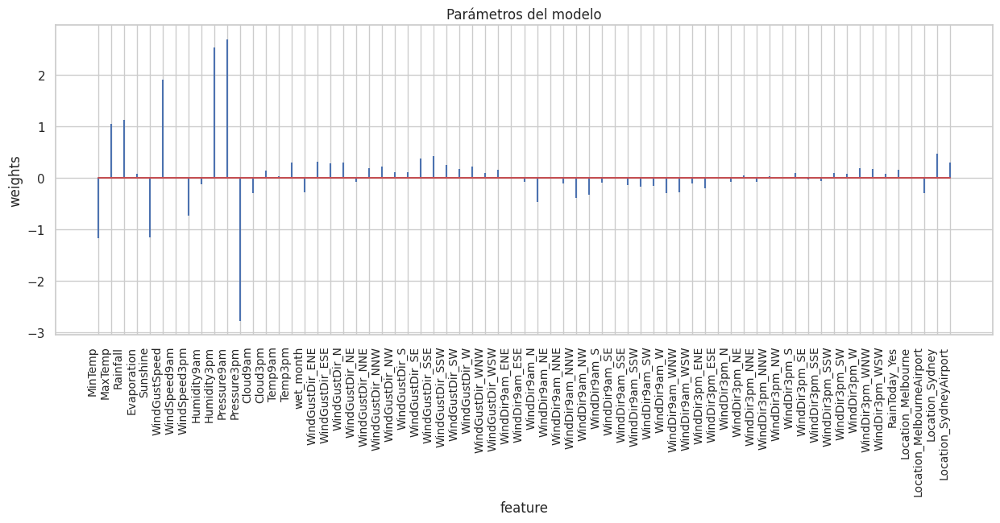

In [109]:
# Coeficientes del modelo
df_coeficientes = pd.DataFrame({'predictor': X_train.columns, 'coef': linear_regression.coef_.flatten()})

# Crear un gráfico de barras para mostrar los coeficientes
fig, ax = plt.subplots(figsize=(15, 5))
ax.stem(df_coeficientes.predictor, df_coeficientes.coef, markerfmt=' ')
plt.xticks(rotation=90, ha='right', size=10)
ax.set_xlabel('feature')
ax.set_ylabel('weights')
ax.set_title('Parámetros del modelo')
plt.show()

#### 3.4.3 - Metricas
A continuación se calculan las métricas de la regresión.

1. **R2 Ajustado**: El coeficiente de determinación ajustado, o R2 ajustado, es una métrica que evalúa la calidad de un modelo de regresión.
Es similar al R2, pero tiene en cuenta el número de características (predictores) en el modelo.
Proporciona una medida de cuánta variabilidad en la variable objetivo (variable dependiente) se explica por el modelo, ajustado por el número de características.
Cuanto más cercano a 1, mejor es el modelo.

2. **Mean Squared Error (MSE)**: El Error Cuadrático Medio (MSE) es una métrica que mide la magnitud promedio de los errores entre las predicciones de un modelo y los valores reales en el conjunto de datos.
Calcula la diferencia cuadrada entre las predicciones y los valores reales para cada punto de datos y luego toma el promedio de esas diferencias al cuadrado.
Cuanto menor sea el MSE, mejor será el ajuste del modelo a los datos. MSE penaliza de manera más severa los errores grandes.

3. **Root Mean Squared Error (RMSE)**: El Error Cuadrático Medio de la Raíz (RMSE) es una métrica relacionada con el MSE, pero se expresa en la misma unidad que la variable objetivo.
Es la raíz cuadrada del MSE y proporciona una medida de dispersión de los errores en la misma escala que la variable objetivo.
Al igual que el MSE, cuanto menor sea el RMSE, mejor será el ajuste del modelo.

In [110]:
# Número de observaciones
n = len(y_test)

# Número de características (predictores)
p = X_test_scaled.shape[1]

# Calcular el R2
r2 = r2_score(y_test, y_predictions)

# Calcular el MSE
mse = mean_squared_error(y_test, y_predictions)

# Calcular el RMSE
rmse = np.sqrt(mse)

# Calcular el R2 ajustado
adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Imprimir las métricas en la consola
print(f"R2 Ajustado: {adjusted_r2:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

R2 Ajustado: 0.2368
Mean Squared Error (MSE): 43.6696
Root Mean Squared Error (RMSE): 6.6083


#### 3.4.4 - Gráfico de predicciones sobre el conjunto de prueba vs los valores reales.

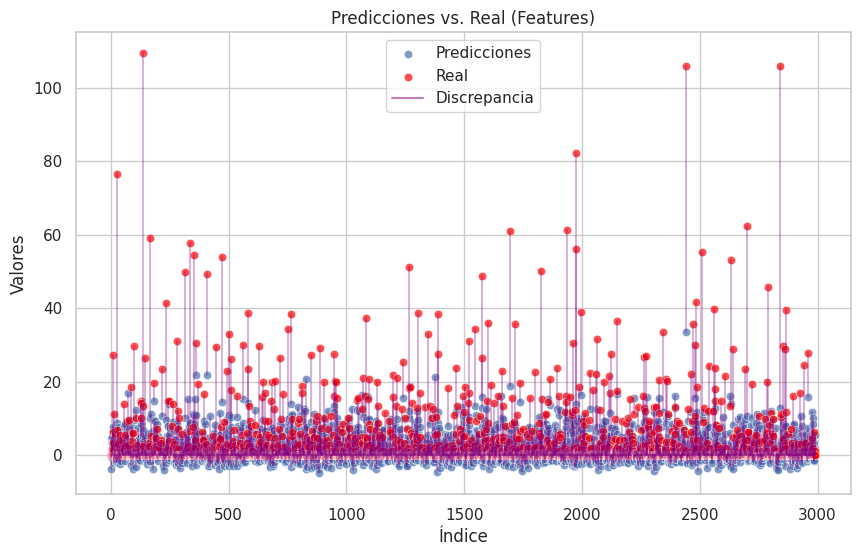

In [111]:
x = np.arange(len(y_test))
y = y_predictions.ravel()  # Convierte a un arreglo 1D

plt.figure(figsize=(10, 6))
sns.scatterplot(x=x, y=y, alpha=0.7, label='Predicciones')
sns.scatterplot(x=x, y=y_test.ravel(), alpha=0.7, color='red', label='Real')

# Unir los puntos con una línea púrpura
for i in range(len(x)):
    plt.plot([x[i], x[i]], [y[i], y_test.ravel()[i]], color='purple', alpha=0.3)

plt.title("Predicciones vs. Real (Features)")
plt.xlabel("Índice")
plt.ylabel("Valores")

# Agregar una sola línea púrpura a la leyenda con la etiqueta "Discrepancia"
plt.plot([], [], color='purple', alpha=0.5, label='Discrepancia')

plt.legend()
plt.show()

### 3.5 - Otros intentos
Al ver el pobre desempeño del primer intento se hicieron otras pruebas.

#### 3.5.1 - Eliminar outliers en variable objetivo

En el gráfico 3.4.4 puede verse que el modelo es malo para predecir valores de lluvia muy altos. Y  MSE penaliza de manera más severa los errores grandes. Teniendo en cuenta que en el conjunto de test sólo unos 25 valores de 3000 (0,83%) superan los 40 mm, se entrenará un modelo sin los outliers y se evaluará la nueva regresión.


In [112]:
# Suponiendo que weatherAUS_LR es tu DataFrame original
weatherAUS_outliers = weatherAUS_LR[weatherAUS_LR['RainfallTomorrow'] <= 40].copy()


datos_elim_out = round((100-weatherAUS_outliers.shape[0]*100/weatherAUS_df.shape[0]),2)
print('Porcentaje de datos eliminados',datos_elim_out, '%')

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train_out, X_test_out, y_train_out, y_test_out = train_test_split(weatherAUS_outliers.drop('RainfallTomorrow', axis=1),
                                             weatherAUS_outliers['RainfallTomorrow'].values.reshape(-1,1),
                                             test_size=0.2,
                                             random_state=7,
                                             )

# Estandarizar las características
scaler = StandardScaler()
X_train_out_scaled=scaler.fit_transform(X_train_out)
X_test_out_scaled=scaler.transform(X_test_out)

# Crear un modelo de regresión lineal
linear_regression_out = LinearRegression(fit_intercept=True)

# Ajustar el modelo a los datos de entrenamiento
linear_regression_out.fit(X_train_out_scaled,y_train_out)

# Realizar predicciones en los datos de prueba
y_predictions_out = linear_regression_out.predict(X_test_out_scaled)

# Número de observaciones
n = len(y_test_out)

# Número de características (predictores)
p = X_test_out_scaled.shape[1]

# Calcular el R2
r2_out = r2_score(y_test_out, y_predictions_out)

# Calcular el MSE
mse_out = mean_squared_error(y_test_out, y_predictions_out)

# Calcular el RMSE
rmse_out = np.sqrt(mse_out)

# Calcular el R2 ajustado
adjusted_r2_out = 1 - (1 - r2_out) * (n - 1) / (n - p - 1)

# Imprimir las métricas en la consola
print(f"R2 Ajustado: {adjusted_r2_out:.4f}")
print(f"Mean Squared Error (MSE): {mse_out:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_out:.4f}")

Porcentaje de datos eliminados 2.35 %
R2 Ajustado: 0.2185
Mean Squared Error (MSE): 19.8637
Root Mean Squared Error (RMSE): 4.4569


Puede observarse que este modelo tiene un R2 ajustado inferior, lo que significa que la capacidad de este modelo para explicar la variabilidad de la variable objetivo es peor, pero erra menos al predecir los valores reales.

#### 3.5.2 - Seleccionar las variables que parecen ser más explicativas.

En el gráfico 3.4.2 puede verse que muchas de los coeficientes son muy bajos por lo que se podría probar dejando sólo los más explicativos.

In [113]:
# Seleccionar variables con mayor parámetro en el primer ajuste
selected_columns = ['Pressure3pm', 'Pressure9am', 'Humidity3pm', 'WindGustSpeed', 'Rainfall', 'MaxTemp', 'MinTemp', 'RainfallTomorrow']
weatherAUS_selected = weatherAUS_LR[selected_columns].copy()

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train_selected, X_test_selected, y_train_selected, y_test_selected = train_test_split(weatherAUS_selected.drop('RainfallTomorrow', axis=1),
                                             weatherAUS_selected['RainfallTomorrow'].values.reshape(-1,1),
                                             test_size=0.2,
                                             random_state=7,
                                             )

# Estandarizar las características
scaler = StandardScaler()
X_train_selected_scaled=scaler.fit_transform(X_train_selected)
X_test_selected_scaled=scaler.transform(X_test_selected)

# Crear un modelo de regresión lineal
linear_regression_selected = LinearRegression(fit_intercept=True)

# Ajustar el modelo a los datos de entrenamiento
linear_regression_selected.fit(X_train_selected_scaled,y_train_selected)

# Realizar predicciones en los datos de prueba
y_predictions_selected = linear_regression_selected.predict(X_test_selected_scaled)

# Número de observaciones
n = len(y_test_selected)

# Número de características (predictores)
p = X_test_selected_scaled.shape[1]

# Calcular el R2
r2_selected = r2_score(y_test_selected, y_predictions_selected)

# Calcular el MSE
mse_selected = mean_squared_error(y_test_selected, y_predictions_selected)

# Calcular el RMSE
rmse_selected = np.sqrt(mse_selected)

# Calcular el R2 ajustado
adjusted_r2_selected = 1 - (1 - r2_selected) * (n - 1) / (n - p - 1)

# Imprimir las métricas en la consola
print(f"R2 Ajustado: {adjusted_r2_selected:.4f}")
print(f"Mean Squared Error (MSE): {mse_selected:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_selected:.4f}")

R2 Ajustado: 0.2169
Mean Squared Error (MSE): 45.7271
Root Mean Squared Error (RMSE): 6.7622


Este modelo es inferior en MSE al que excluye los outliers e inferior en R2 ajustado al primero. Por lo que queda descartado.

#### 3.5.3 - Eliminar la dirección del viento.
Se hará otro modelo eliminando las variables de dirección del viento que al codificarlas introducen muchas variables de muy poco peso en los coeficientes.

In [114]:
# Excluir columnas de la dirección del viento
columns_to_exclude = [col for col in weatherAUS_LR.columns if "Dir" in col]
weatherAUS_no_dir = weatherAUS_LR.drop(columns=columns_to_exclude).copy()

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train_no_dir, X_test_no_dir, y_train_no_dir, y_test_no_dir = train_test_split(weatherAUS_no_dir.drop('RainfallTomorrow', axis=1),
                                             weatherAUS_no_dir['RainfallTomorrow'].values.reshape(-1,1),
                                             test_size=0.2,
                                             random_state=7,
                                             )

# Estandarizar las características
scaler = StandardScaler()
X_train_no_dir_scaled=scaler.fit_transform(X_train_no_dir)
X_test_no_dir_scaled=scaler.transform(X_test_no_dir)

# Crear un modelo de regresión lineal
linear_regression_no_dir = LinearRegression(fit_intercept=True)

# Ajustar el modelo a los datos de entrenamiento
linear_regression_no_dir.fit(X_train_no_dir_scaled,y_train_no_dir)

# Realizar predicciones en los datos de prueba
y_predictions_no_dir = linear_regression_no_dir.predict(X_test_no_dir_scaled)

# Número de observaciones
n = len(y_test_no_dir)

# Número de características (predictores)
p = X_test_no_dir_scaled.shape[1]

# Calcular el R2
r2_no_dir = r2_score(y_test_no_dir, y_predictions_no_dir)

# Calcular el MSE
mse_no_dir = mean_squared_error(y_test_no_dir, y_predictions_no_dir)

# Calcular el RMSE
rmse_no_dir = np.sqrt(mse_no_dir)

# Calcular el R2 ajustado
adjusted_r2_no_dir = 1 - (1 - r2_no_dir) * (n - 1) / (n - p - 1)

# Imprimir las métricas en la consola
print(f"R2 Ajustado: {adjusted_r2_no_dir:.4f}")
print(f"Mean Squared Error (MSE): {mse_no_dir:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_no_dir:.4f}")

R2 Ajustado: 0.2435
Mean Squared Error (MSE): 43.9500
Root Mean Squared Error (RMSE): 6.6295


Este modelo ofrece una mejor explicación de la variabilidad de la variable objetivo en comparación con cualquier otro modelo, pero tiene un desempeño inferior tanto al primer modelo como al modelo sin outliers al predecir los valores reales, lo que se refleja en un MSE más alto.

#### 3.5.3 - Eliminar outliers en variable objetivo y las features de dirección del viento.

Se logró reducir el MSE eliminando los outliers en la variable objetivo y aumentar el R2 ajustado eliminando las features de dirección del viento. Se probará, ahora, combinar ambas medidas.

In [115]:
weatherAUS_comb = weatherAUS_LR[weatherAUS_LR['RainfallTomorrow'] <= 40].copy()

columns_to_exclude = [col for col in weatherAUS_LR.columns if "Dir" in col]

weatherAUS_comb.drop(columns=columns_to_exclude, inplace = True)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train_comb, X_test_comb, y_train_comb, y_test_comb = train_test_split(weatherAUS_comb.drop('RainfallTomorrow', axis=1),
                                             weatherAUS_comb['RainfallTomorrow'].values.reshape(-1,1),
                                             test_size=0.2,
                                             random_state=7,
                                             )

# Estandarizar las características
scaler = StandardScaler()
X_train_comb_scaled=scaler.fit_transform(X_train_comb)
X_test_comb_scaled=scaler.transform(X_test_comb)

# Crear un modelo de regresión lineal
linear_regression_comb = LinearRegression(fit_intercept=True)

# Ajustar el modelo a los datos de entrenamiento
linear_regression_comb.fit(X_train_comb_scaled,y_train_comb)

# Realizar predicciones en los datos de prueba
y_predictions_comb = linear_regression_comb.predict(X_test_comb_scaled)

# Número de observaciones
n = len(y_test_comb)

# Número de características (predictores)
p = X_test_comb_scaled.shape[1]

# Calcular el R2
r2_comb = r2_score(y_test_comb, y_predictions_comb)

# Calcular el MSE
mse_comb = mean_squared_error(y_test_comb, y_predictions_comb)

# Calcular el RMSE
rmse_comb = np.sqrt(mse_comb)

# Calcular el R2 ajustado
adjusted_r2_comb = 1 - (1 - r2_comb) * (n - 1) / (n - p - 1)

# Imprimir las métricas en la consola
print(f"R2 Ajustado: {adjusted_r2_comb:.4f}")
print(f"Mean Squared Error (MSE): {mse_comb:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_comb:.4f}")

R2 Ajustado: 0.2288
Mean Squared Error (MSE): 19.9050
Root Mean Squared Error (RMSE): 4.4615


Este resultado muestra que combinar las estrategias no da resultado porque a pesar de haberse reducido el MSE con respecto al primer modelo, el R2 en este caso no aumentó.

### 3.6 - Elección del modelo
Al no lograr un modelo óptimo, dónde R2 ajustado sea máximo y el MSE mínimo, no hay un modelo que sea claramente superior.

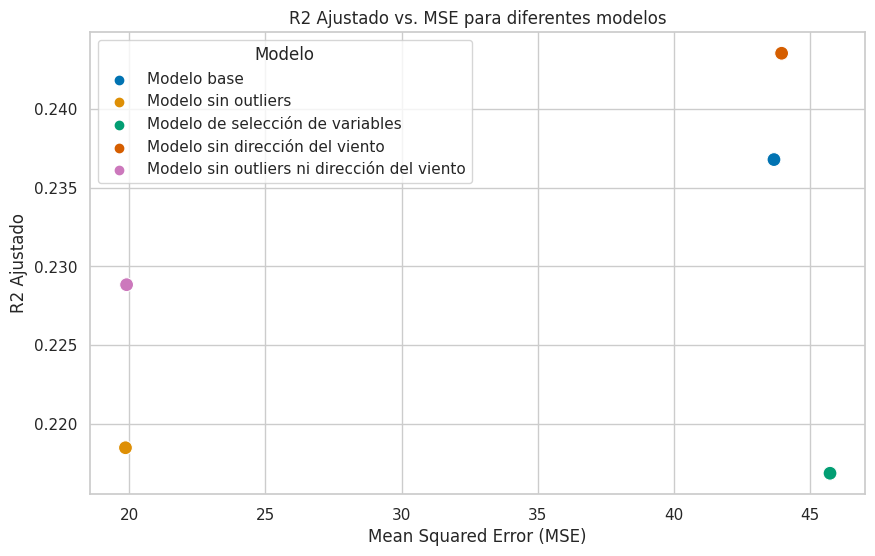

In [116]:
# Valores de R2 Ajustado y MSE para cada modelo
modelos = ['Modelo base', 'Modelo sin outliers', 'Modelo de selección de variables', 'Modelo sin dirección del viento', 'Modelo sin outliers ni dirección del viento']
r2_ajustado = [adjusted_r2, adjusted_r2_out, adjusted_r2_selected, adjusted_r2_no_dir, adjusted_r2_comb]
mse = [mse, mse_out, mse_selected, mse_no_dir, mse_comb]

# Crear un DataFrame con los datos
import pandas as pd
data = pd.DataFrame({'Modelo': modelos, 'R2 Ajustado': r2_ajustado, 'MSE': mse})

# Configurar el estilo de Seaborn
sns.set(style="whitegrid")

# Crear el gráfico utilizando Seaborn
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='MSE', y='R2 Ajustado', hue='Modelo', palette='colorblind', s=100)

# Etiquetas y título
plt.xlabel('Mean Squared Error (MSE)')
plt.ylabel('R2 Ajustado')
plt.title('R2 Ajustado vs. MSE para diferentes modelos')

# Mostrar el gráfico
plt.grid(True)
plt.show()


Ahora resta elegir entre:

1. **Modelo con mayor R2 ajustado**: Es un modelo se ajusta mejor a la variabilidad de los datos en promedio. Ofrece una explicación razonable de la variabilidad en la variable objetivo. A menudo, este modelo se adapta mejor al patrón general de los datos. Sin embargo, cuando comete errores, estos errores pueden ser más significativos, lo que resulta en un MSE más alto. Es decir, puede haber valores atípicos o desviaciones más grandes en sus predicciones cuando se aleja del patrón general.

2. **Modelo con menor R2 ajustado**: Este modelo no se ajusta tan bien a la variabilidad de los datos en promedio.
No logra explicar tan bien la variabilidad en la variable objetivo como el otro modelo.
Puede ser más resistente a valores atípicos o desviaciones extremas, lo que se refleja en un MSE más bajo. A pesar de tener un R2 ajustado más bajo, su capacidad para predecir valores cercanos a la verdad es mejor en promedio.

Pero recordemos que el modelo de menor MSE es un modelo que eliminaba los datos atípicos, por lo que los valores "reales" con los que se compara son, en realidad, ficticios. Adicionalmente, si lo que se desea es predecir si lloverá o no, uno querría acertar usualmente y errar unas pocas aunque sea por mucho. En consecuencia, el modelo elegido es el de mejor R2 ajustado: El que no tiene en cuenta la dirección del viento.

In [117]:
# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(weatherAUS_no_dir.drop('RainfallTomorrow', axis=1),
                                             weatherAUS_no_dir['RainfallTomorrow'].values.reshape(-1,1),
                                             test_size=0.2,
                                             random_state=7,
                                             )

# Estandarizar las características
scaler = StandardScaler()
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

# Crear un modelo de regresión lineal
linear_regression = LinearRegression(fit_intercept=True)

# Ajustar el modelo a los datos de entrenamiento
linear_regression.fit(X_train_scaled,y_train)

y_predictions = linear_regression.predict(X_test_scaled)

# Número de observaciones
n = len(y_test)

# Número de características (predictores)
p = X_test_scaled.shape[1]

# Calcular el R2
r2 = r2_score(y_test, y_predictions)

# Calcular el MSE
mse = mean_squared_error(y_test, y_predictions)

# Calcular el RMSE
rmse = np.sqrt(mse)

# Calcular el R2 ajustado
adjusted_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Imprimir las métricas en la consola
print(f"R2 Ajustado: {adjusted_r2:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

R2 Ajustado: 0.2435
Mean Squared Error (MSE): 43.9500
Root Mean Squared Error (RMSE): 6.6295


## 4 - Gradiente Descendiente

Se probarán ahora, métodos de gradiente descendiente para minimizar la función de error y hallar los parámetros óptimos para la regresión lineal.

### 4.1 - Definir funciones de gradiente descendiente

Se defininen a continuación, las funciones para aplicar los distintos métodos de gradiente descendiente

#### 4.1.1 - Función Gradiente Descendiente

El gradiente descendiente es un algoritmo de optimización utilizado para encontrar los valores óptimos de los parámetros de un modelo.

El objetivo principal del gradiente descendiente es minimizar una función de costo al ajustar iterativamente los parámetros del modelo. Comienza con valores iniciales para los parámetros y se desplaza en la dirección opuesta al gradiente de la función de costo para reducir el error. Este proceso se repite en cada iteración hasta que se alcanza un mínimo o un punto de convergencia.

In [118]:
def gradient_descent(X_train, y_train, X_test, y_test, lr=0.01, epochs=100):
    """
    shapes:
        X_train = nxm
        y_train = nx1
        X_test = pxm
        y_test = px1
        W = mx1
    """
    n = X_train.shape[0]
    m = X_train.shape[1]

    o = X_test.shape[0]

    # Poner columna de unos a las matrices X
    X_train = np.hstack((np.ones((n, 1)), X_train))
    X_test = np.hstack((np.ones((o, 1)), X_test))

    # Inicializar pesos aleatorios
    W = np.random.randn(m+1).reshape(m+1, 1)

    train_errors = []  # Para almacenar el error de entrenamiento en cada época
    test_errors = []   # Para almacenar el error de prueba en cada época

    for i in range(epochs):
        # Calcular predicción y error de entrenamiento
        prediction_train = np.matmul(X_train, W)
        error_train = y_train - prediction_train
        train_mse = np.mean(error_train ** 2)
        train_errors.append(train_mse)

        # Calcular predicción y error de prueba
        prediction_test = np.matmul(X_test, W)
        error_test = y_test - prediction_test
        test_mse = np.mean(error_test ** 2)
        test_errors.append(test_mse)

        # Calcular el gradiente y actualizar pesos
        gradient = -2/n * np.matmul(X_train.T, error_train)  # mx1
        W = W - (lr * gradient)

    # Graficar errores de entrenamiento y prueba
    # Definir una figura
    plt.figure(figsize=(12, 6))
    # Plotear errores de entrenamiento
    plt.plot(train_errors, label='Error de entrenamiento')
    # Plotear errores de prueba
    plt.plot(test_errors, label='Error de test')
    # Poner labels en los ejes
    plt.xlabel('Época')
    plt.ylabel('Error cuadrático medio')
    # Activar la leyenda
    plt.legend()
    # Poner titulo
    plt.title('Error de entrenamiento y prueba vs iteraciones (GD)')
    # Terminar y mostrar gráfico
    plt.show()

    return W, min(test_errors)

#### 4.1.2 - Gradiente Descendiente estocástico

El gradiente descendiente estocástico es una variante del gradiente descendiente que utiliza un solo ejemplo de entrenamiento seleccionado al azar en cada iteración.

A diferencia del GD convencional, que utiliza el conjunto completo de datos en cada iteración, el SGD toma un enfoque estocástico seleccionando un ejemplo aleatorio y actualiza los parámetros según el gradiente de ese ejemplo. Esto puede hacer que el algoritmo sea más rápido y más adecuado para datos masivos, pero también puede generar una convergencia más ruidosa.

In [119]:
def stochastic_gradient_descent(X_train, y_train, X_test, y_test, lr=0.01, epochs=100):

    n = X_train.shape[0]
    m = X_train.shape[1]

    X_train = np.hstack((np.ones((n, 1)), X_train))
    X_test = np.hstack((np.ones((X_test.shape[0], 1)), X_test))

    W = np.random.randn(m + 1).reshape(-1, 1)

    train_errors = []
    test_errors = []

    for i in range(epochs):
        # Permutación aleatoria de los datos
        permutation = np.random.permutation(n)
        X_train = X_train[permutation]
        y_train = y_train[permutation]

        for j in range(n):
            # Obtener una muestra aleatoria de un solo dato para hacer SGD
            x_sample = X_train[j]
            y_sample = y_train[j][0]

            prediction = np.matmul(x_sample, W)
            error = y_sample - prediction
            train_mse = error ** 2
            train_errors.append(train_mse)

            gradient = -2 * error * x_sample.T.reshape(-1, 1)

            W = W - (lr * gradient)

            prediction_test = np.matmul(X_test, W)
            error_test = y_test - prediction_test
            test_mse = np.mean(error_test ** 2)
            test_errors.append(test_mse)

    plt.figure(figsize=(12, 6))
    plt.plot(train_errors, label='Error de entrenamiento')
    plt.plot(test_errors, label='Error de prueba')
    plt.xlabel('Iteración')
    plt.ylabel('Error cuadrático medio')
    plt.legend()
    plt.title('Error de entrenamiento y prueba vs iteraciones (SGD)')
    plt.show()

    return W, min(test_errors)

#### 4.1.3 - Gradiente Descendiente Mini-Batch

El gradiente descendiente en mini-batch es una combinación de los dos métodos anteriores. En lugar de utilizar todo el conjunto de datos o un solo ejemplo, se divide en lotes más pequeños llamados "mini-batches".

El Mini-Batch GD calcula el gradiente y actualiza los parámetros utilizando un mini-batch de ejemplos en cada iteración. Esto permite un equilibrio entre la eficiencia de cómputo del GD y la velocidad del SGD, lo que es útil para conjuntos de datos de tamaño mediano.

In [153]:
def mini_batch_gradient_descent(X_train, y_train, X_test, y_test, lr=0.01, epochs=100, batch_size=500):
    n = X_train.shape[0]
    m = X_train.shape[1]

    X_train = np.hstack((np.ones((n, 1)), X_train))
    X_test = np.hstack((np.ones((X_test.shape[0], 1)), X_test))

    W = np.random.randn(m + 1).reshape(-1, 1)

    train_errors = []
    test_errors = []

    for i in range(epochs):

        # Permutación aleatoria de los datos
        permutation = np.random.permutation(n)
        X_train = X_train[permutation]
        y_train = y_train[permutation]


        for j in range(0, n, batch_size):
            # Obtener un lote (mini-batch) de datos
            x_batch = X_train[j:j+batch_size, :]
            y_batch = y_train[j:j+batch_size].reshape(-1, 1)

            prediction = np.matmul(x_batch, W)
            error = y_batch - prediction
            train_mse = np.mean(error ** 2)
            train_errors.append(train_mse)

            gradient = -2 * np.matmul(x_batch.T, error) / batch_size

            W = W - (lr * gradient)

            prediction_test = np.matmul(X_test, W)
            error_test = y_test - prediction_test
            test_mse = np.mean(error_test ** 2)
            test_errors.append(test_mse)

    plt.figure(figsize=(12, 6))
    plt.plot(train_errors, label='Error de entrenamiento')
    plt.plot(test_errors, label='Error de prueba')
    plt.xlabel('Iteración')
    plt.ylabel('Error cuadrático medio')
    plt.legend()
    plt.title('Error de entrenamiento y prueba vs iteraciones (Mini-Batch GD)')
    plt.show()

    return W, min(test_errors)

### 4.2 - Gradiente descendiente

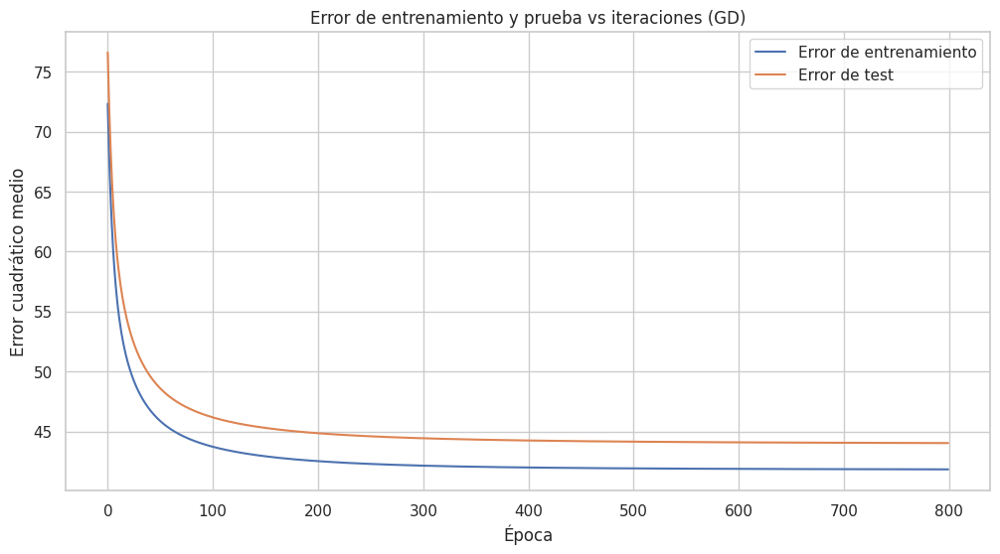

RMSE mínimo: 6.6371 


In [146]:
mse_GD = gradient_descent(X_train_scaled, y_train, X_test_scaled, y_test, lr=0.01, epochs=800)[1]
rmse_GD = np.sqrt(mse_GD)

print(f"RMSE mínimo: {rmse_GD:.4f} ")

El método de Gradiente Descediente logra un error muy parecido al de la función de regresión lineal de scikit-learn.

### 4.3 - Gradiente descendiente estocástico

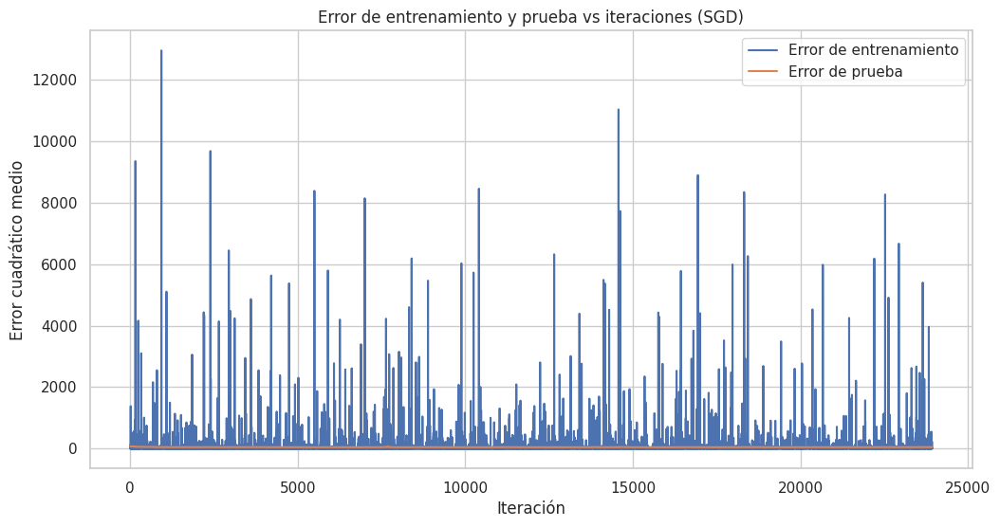

RMSE mínimo: 6.6303 


In [147]:
mse_GDS = stochastic_gradient_descent(X_train_scaled, y_train, X_test_scaled, y_test, epochs=2, lr=0.001)[1]
rmse_GDS = np.sqrt(mse_GDS)

print(f"RMSE mínimo: {rmse_GDS:.4f} ")

El método estocástico, realiza muchísimas más iteraciones pero con un learning rate inferior logra hallar unos valores para los parámetros que predicen de mejor manera los valores del conjunto de prueba.

### 4.4 - Gradiente descendiente Mini-batch

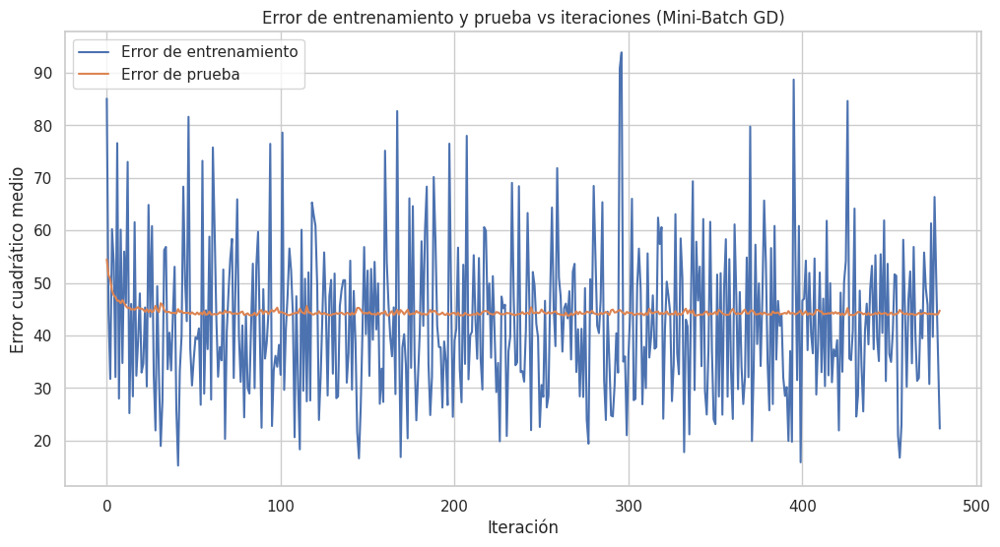

RMSE mínimo: 6.6177 


In [169]:
mse_GDMB = mini_batch_gradient_descent(X_train_scaled, y_train, X_test_scaled, y_test, epochs=20, lr=0.1)[1]
rmse_GDMB = np.sqrt(mse_GDMB)

print(f"RMSE mínimo: {rmse_GDMB:.4f} ")

El Gradiente Descendiente combina lo mejor de los dos mundos alcanzando en pocas iteraciones un error con respecto al conjunto de prueba menor incluso que el de la función de Scikit-Learn.

## 5 - Regularización
La regularización en un modelo de regresión lineal es una técnica utilizada para prevenir el sobreajuste (overfitting) del modelo, es decir, que el modelo se ajuste demasiado a los datos de entrenamiento y no generaliza bien a nuevos datos. Se logra al agregar un término adicional a la función de costo o pérdida del modelo.

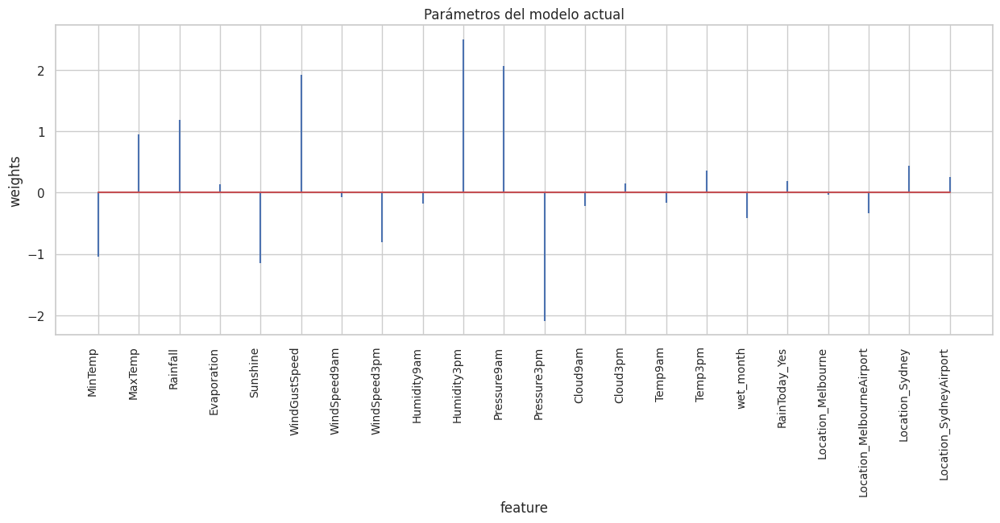

In [124]:
# Coeficientes del modelo actual
df_coeficientes = pd.DataFrame({'predictor': X_train.columns, 'coef': linear_regression.coef_.flatten()})

fig, ax = plt.subplots(figsize=(15, 5))
ax.stem(df_coeficientes.predictor, df_coeficientes.coef, markerfmt=' ')
plt.xticks(rotation=90, ha='right', size=10)
ax.set_xlabel('feature')
ax.set_ylabel('weights')
ax.set_title('Parámetros del modelo actual')
plt.show()

### 5.1 - Regresión Ridge (Regularización L2)
En la regresión Ridge, se agrega un término de penalización a la función de costo que es proporcional al cuadrado de los coeficientes. Esto significa que los coeficientes de la regresión son forzados a mantenerse pequeños, lo que reduce la magnitud de los coeficientes y, por lo tanto, la flexibilidad del modelo. Esto ayuda a prevenir el sobreajuste.


#### 5.1.1 - Creación y entrenamiento del modelo
 Scikit-Learn usa Cross Validation para encontrar el valor óptimo de alpha.


In [125]:
# Creación y entrenamiento del modelo.
modelo = make_pipeline(StandardScaler(),
                        RidgeCV(
                           alphas          = np.logspace(0, 7, 200),
                           fit_intercept   = True,
                           store_cv_values = True
                        )
         )

_ = modelo.fit(X_train, y_train)

#### 5.1.2 - Evolución de los parámentros en función de alfa

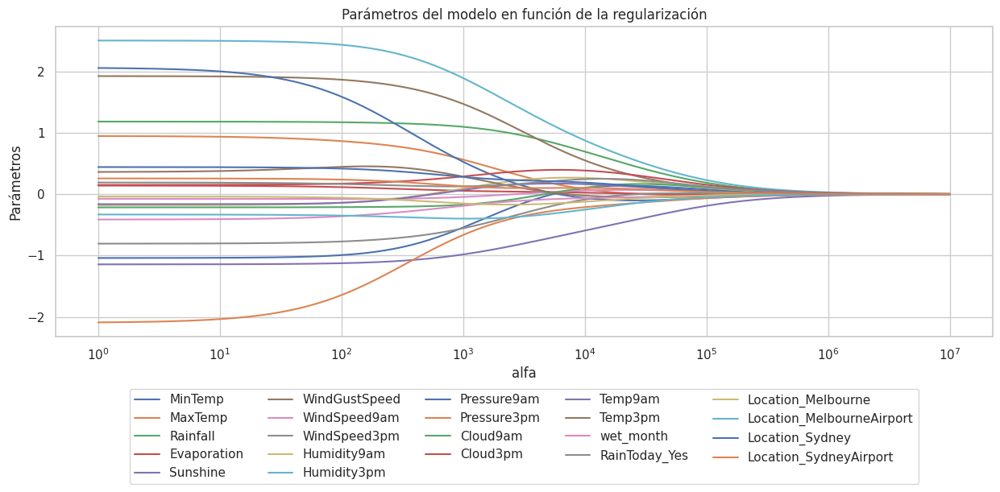

In [126]:
# Evolución de los parámetros en función de alpha
alphas = modelo.steps[1][1].alphas
coefs = []

for alpha in alphas:
    modelo_aux = make_pipeline(StandardScaler(), Ridge(alpha=alpha))
    modelo_aux.fit(X_train, y_train)
    coefs.append(modelo_aux.steps[1][1].coef_.flatten())

fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(alphas, coefs, label=X_train.columns)
ax.set_xscale('log')
ax.set_xlabel('alfa')
ax.set_ylabel('Parámetros')
ax.set_title('Parámetros del modelo en función de la regularización')
plt.axis('tight')

# Configurar la leyenda
legend = ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=5)
for handle in legend.legendHandles:
    handle.set_linewidth(1.5)

plt.show()

En este gráfico puede verse como el valor de los parámetros del modelo van tendiendo a cero a medida que el factor de proporcionalidad del término de penalización (alfa) aumenta.

#### 5.1.3 - Hallar el alfa óptimo
Se propone encontrar la constante de proporcionalidad alfa, para el término de penalización de Ridge para minimizar la función de error.

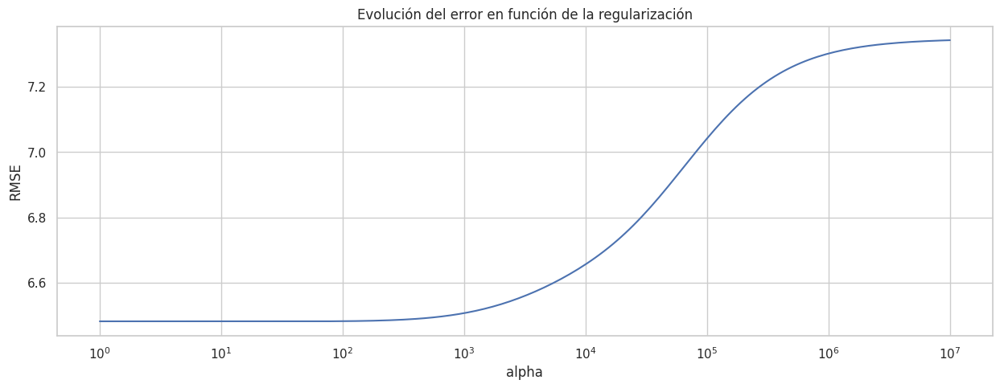

Mejor valor de alpha encontrado: 30.02


In [127]:
# Evolución del error de validación cruzada en función de alpha

# modelo.cv_values almacena el MSE de CV para cada valor de alpha.
mod = modelo.steps[1][1]
mse_cv = mod.cv_values_.reshape((-1, 200)).mean(axis=0)

# Se aplica la raíz cuadrada para pasar de mse a rmse
rmse_cv = np.sqrt(mse_cv)

# Se identifica el mejor
min_rmse = np.min(rmse_cv)
optimo = mod.alphas[np.argmin(rmse_cv)]

fig, ax = plt.subplots(figsize=(15,5))
ax.plot(mod.alphas, rmse_cv)
ax.set_xscale('log')
ax.set_title('Evolución del error en función de la regularización')
ax.set_xlabel('alpha')
ax.set_ylabel('RMSE')
plt.show()

# Mejor valor alpha encontrado
print(f"Mejor valor de alpha encontrado: {mod.alpha_:.2f}")

En este gráfico puede observarse la evolución de la función de error RMSE en función de alfa. El alfa óptimo es el que minimice a esta función, en este caso: ~30.02

#### 5.1.4 - Métricas de Ridge

In [128]:
# Predicciones test
y_pred = modelo.predict(X_test)

# Error de test del modelo
rmse_ridge = mean_squared_error(y_test,
                y_pred,
                squared = False
             )
# R2
r2_ridge = metrics.r2_score(y_test, y_pred)

# Número de observaciones
n = len(y_test)

# Número de características (predictores)
p = X_test_scaled.shape[1]

# Calcular el R2 ajustado
adjusted_r2_ridge = 1 - (1 - r2_ridge) * (n - 1) / (n - p - 1)

print(f"El R2 ajustado de la regresión ridge es: {adjusted_r2_ridge:.4}")
print(f"El error (rmse) de test es: {rmse_ridge:.4f}")

El R2 ajustado de la regresión ridge es: 0.2435
El error (rmse) de test es: 6.6297


### 5.2 - Regresión Lasso (Regularización L1)

En la regresión Lasso, se agrega un término de penalización a la función de costo que es proporcional al valor absoluto de los coeficientes. La característica distintiva de Lasso es que puede conducir a la eliminación de ciertos coeficientes al hacer que sean exactamente cero. Esto no solo previene el sobreajuste, sino que también realiza la selección de características, lo que significa que algunas características se excluyen automáticamente del modelo.

#### 5.2.1 - Creación y entrenamiento del modelo

In [129]:
modelo = make_pipeline(StandardScaler(),
                        LassoCV(
                           alphas=np.logspace(-3, 1, 200),
                           cv=10
                        )
         )

_ = modelo.fit(X_train, y_train)

#### 5.2.2 - Evolución de los parámentros en función de alfa

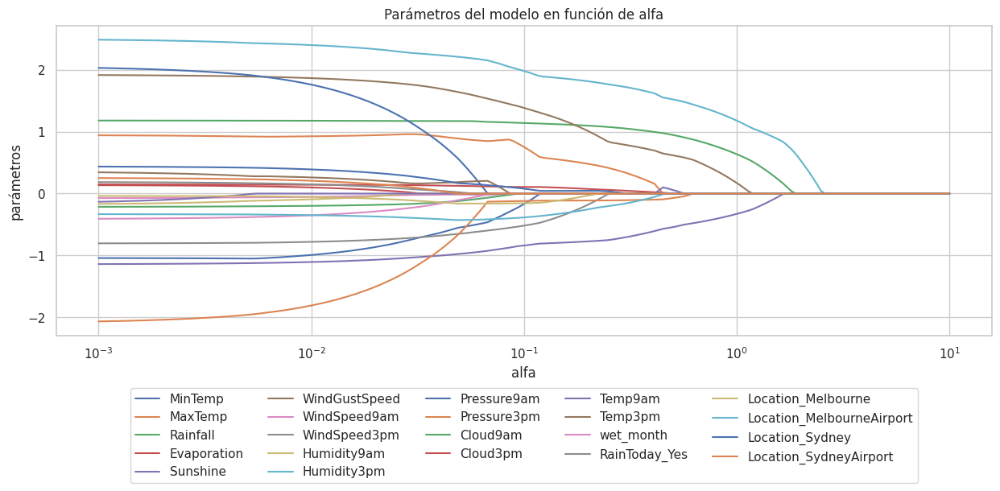

In [130]:
# Evolución de los parámetros en función de alpha
mod = modelo.steps[1][1]

alphas = mod.alphas_
coefs = []

for alpha in alphas:
    modelo_aux = make_pipeline(StandardScaler(), Lasso(alpha=alpha))
    modelo_aux.fit(X_train, y_train)
    coefs.append(modelo_aux.steps[1][1].coef_.flatten())

fig, ax = plt.subplots(figsize=(15,5))
ax.plot(alphas, coefs, label=X_train.columns)
ax.set_xscale('log')
ax.set_xlabel('alfa')
ax.set_ylabel('parámetros')
ax.set_title('Parámetros del modelo en función de alfa')

# Configurar la leyenda
legend = ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=5)
for handle in legend.legendHandles:
    handle.set_linewidth(1.5)

plt.show()

En el gráfico se observa cómo la regresión Lasso es mucho más agresiva para eliminar coeficientes, quedando algunos en el camino muy temprano, a diferencia de Ridge dónde todos se anulaban para valores de alfa muy próximos.

#### 5.2.3 - Gráfico de la cantidad de variables incluidas en el modelo en función de alfa

Text(0.5, 1.0, 'Features incluidas en función de la regularización')

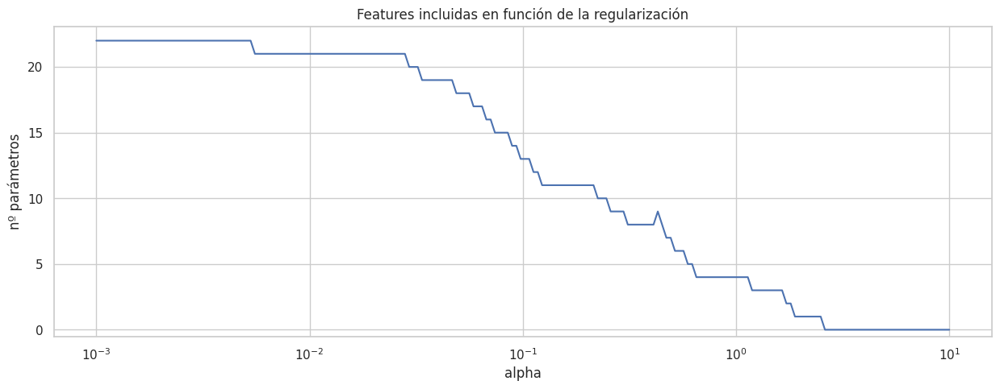

In [131]:
# Número de features incluidas (parámetros !=0) en función de alpha
alphas = mod.alphas_
n_predictores = []

for alpha in alphas:
    modelo_aux = make_pipeline(StandardScaler(), Lasso(alpha=alpha))
    modelo_aux.fit(X_train, y_train)
    coef_no_cero = np.sum(modelo_aux.steps[1][1].coef_.flatten() != 0)
    n_predictores.append(coef_no_cero)

fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(alphas, n_predictores)
ax.set_xscale('log')
ax.set_ylim([-0.5,None])
ax.set_xlabel('alpha')
ax.set_ylabel('nº parámetros')
ax.set_title('Features incluidas en función de la regularización')

#### 5.2.4 - Error en función de alfa
Aquí también se busca el alfa que minimice la función de error (RMCE).

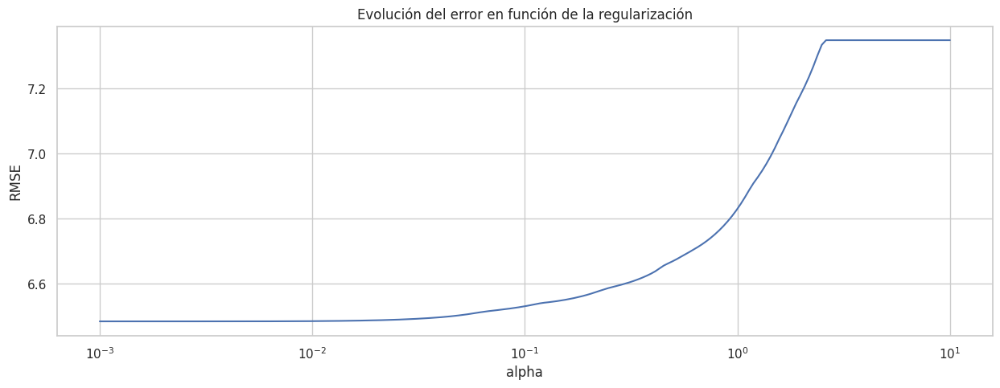

Mejor valor de alpha encontrado: 0.0020


In [132]:
# Evolución del error de validación cruzada en función de alpha
# modelo.mse_path almacena el MSE de CV para cada valor de alpha.
mse_cv = mod.mse_path_.mean(axis=1)

# Se aplica la raíz cuadrada para pasar de mse a rmse
rmse_cv = np.sqrt(mse_cv)

# Se identifica el mejor
min_rmse     = np.min(rmse_cv)
optimo       = mod.alphas_[np.argmin(rmse_cv)]

# Graficar
fig, ax = plt.subplots(figsize=(15,5))
ax.plot(mod.alphas_, rmse_cv)
ax.set_xscale('log')
ax.set_title('Evolución del error en función de la regularización')
ax.set_xlabel('alpha')
ax.set_ylabel('RMSE')
plt.show()

# Mejor valor alpha encontrado
print(f"Mejor valor de alpha encontrado: {mod.alpha_:.4f}")

Para el caso de la regresión Lasso, no se observa un mínimo local para valores significativos de alfa.

In [133]:
# Predicciones de Lasso
y_pred = modelo.predict(X_test)

# Error de test del modelo
rmse_lasso = mean_squared_error(y_test,
                y_pred,
                squared = False
             )
# R2
r2_lasso = metrics.r2_score(y_test, y_pred)

# Número de observaciones
n = len(y_test)

# Número de características (predictores)
p = X_test_scaled.shape[1]

# Calcular el R2 ajustado
adjusted_r2_lasso = 1 - (1 - r2_lasso) * (n - 1) / (n - p - 1)

print(f"El R2 ajustado de la regresión lasso es: {adjusted_r2_lasso:.4}")
print(f"El error (rmse) de test es: {rmse_lasso:.4f}")

El R2 ajustado de la regresión lasso es: 0.2434
El error (rmse) de test es: 6.6300


### 5.3 - ElasticNet

ElasticNet es una técnica de regularización que combina las características de la regresión Ridge (L2 Regularization) y la regresión Lasso (L1 Regularization) en un solo modelo. Fue desarrollada para aprovechar los beneficios de ambas técnicas al mismo tiempo.

En ElasticNet, se agrega un término de penalización tanto para el cuadrado de los coeficientes (como en Ridge) como para el valor absoluto de los coeficientes (como en Lasso) a la función de costo del modelo. La magnitud de la penalización está controlada por dos hiperparámetros: alpha y l1_ratio.

1. Alpha: Es un hiperparámetro que controla la fuerza de la regularización. Un valor más alto de alpha significa una regularización más fuerte. Si alpha es igual a cero, ElasticNet se convierte en una regresión lineal estándar sin regularización.

2. L1_ratio: Es un hiperparámetro que controla la proporción de la penalización L1 (como en Lasso) en comparación con la penalización L2 (como en Ridge). Si l1_ratio es igual a 1, ElasticNet se comporta como Lasso; si es igual a 0, se comporta como Ridge. Valores intermedios representan combinaciones de ambas regularizaciones.

#### 5.3.1 - Creación y entrenamiento del modelo

In [134]:
modelo = make_pipeline(StandardScaler(),
                        ElasticNetCV(
                              l1_ratio        = [0, 0.1, 0.5, 0.7, 0.9, 0.95, 0.99],
                              alphas          = np.logspace(-10, 10, 200),
                              cv              = 10
                           )
         )

_ = modelo.fit(X_train, y_train)

mod = modelo.steps[1][1]

#### 5.3.2 - Evolución del error de cross validation en función de l1_ratio

El propósito de este gráfico es intentar determinar un valor óptimo de l1_ratio que minimice la función de error.

Mejor valor de alpha encontrado: 0.0034
Mejor valor de l1_ratio encontrado: 0.0


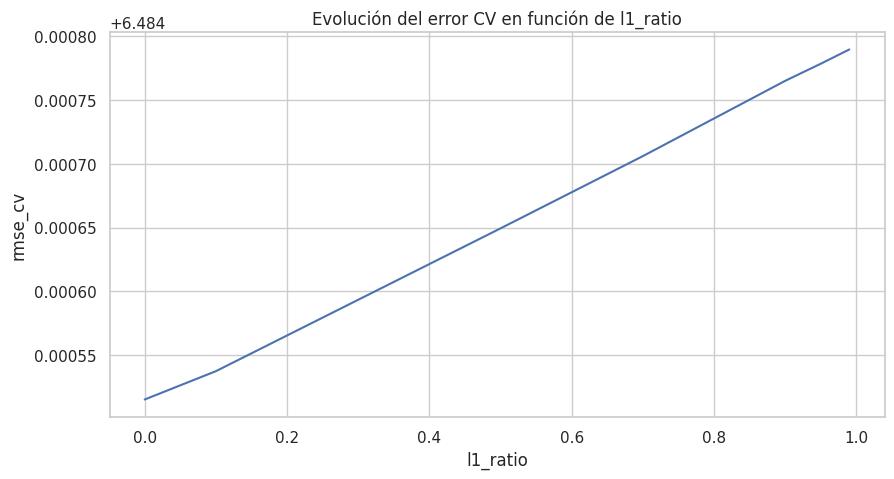

In [135]:
# Error medio de las 10 particiones por cada valor de alpha y l1_ratio
mean_error_cv = mod.mse_path_.mean(axis =2)

# El resultado es un array de dimensiones (n_l1_ratio, n_alpha) se convierte en un dataframe
df_resultados_cv = pd.DataFrame(
                        data   = mean_error_cv.flatten(),
                        index  = pd.MultiIndex.from_product(
                                    iterables = [mod.l1_ratio, mod.alphas_],
                                    names     = ['l1_ratio', 'mod.alphas_']
                                 ),
                        columns = ["mse_cv"]
                    )

df_resultados_cv['rmse_cv'] = np.sqrt(df_resultados_cv['mse_cv'])
df_resultados_cv = df_resultados_cv.reset_index().sort_values('mse_cv', ascending = True)

# Graficar
fig, ax = plt.subplots(figsize=(10, 5))
df_resultados_cv.groupby('l1_ratio')['rmse_cv'].min().plot(ax = ax)
ax.set_title('Evolución del error CV en función de l1_ratio')
ax.set_xlabel('l1_ratio')
ax.set_ylabel('rmse_cv');

# Mejor valor alpha y l1_ratio_ encontrado
print(f"Mejor valor de alpha encontrado: {mod.alpha_:.4f}")
print(f"Mejor valor de l1_ratio encontrado: {mod.l1_ratio_}")

Nuevamente no se observa un mínimo para valores significativos de l1_ratio. El valor óptimo de l1_ratio hallado fue 0, por lo que lo óptimo es utilizar una regularizarización Ridge pura.

In [136]:
# Predicciones de Lasso
y_pred = modelo.predict(X_test)

# Error de test del modelo
rmse_elastic = mean_squared_error(y_test,
                y_pred,
                squared = False
             )
# R2
r2_elastic = metrics.r2_score(y_test, y_pred)

# Número de observaciones
n = len(y_test)

# Número de características (predictores)
p = X_test_scaled.shape[1]

# Calcular el R2 ajustado
adjusted_r2_elastic = 1 - (1 - r2_elastic) * (n - 1) / (n - p - 1)

print(f"El R2 ajustado de la regresión elastic es: {adjusted_r2_elastic:.4}")
print(f"El error (rmse) de test es: {rmse_elastic:.4f}")

El R2 ajustado de la regresión elastic es: 0.2434
El error (rmse) de test es: 6.6298


## 6 - Comparación de modelos


In [170]:
# Crear un diccionario con los datos
data = {
    "Modelo": ["Regresión Lineal", "Gradiente Descendiente", "Gradiente Descendiente Estocástico",
               "Gradiente Descendiente Mini Batch", "Regresión Ridge", "Regresión Lasso", "Regresión ElasticNet"],
    "RMSE": [rmse_no_dir, rmse_GD, rmse_GDS, rmse_GDMB, rmse_ridge, rmse_lasso, rmse_elastic]
}

# Crear un DataFrame a partir del diccionario
df_rmse = pd.DataFrame(data)

#Crear un dataframe para mostrar
df_mostrar = df_rmse.copy()

# Redondear los valores de la columna 'RMSE' a 4 decimales
df_mostrar['RMSE'] = df_mostrar['RMSE'].round(4)

# Mostrar el DataFrame
df_mostrar

,Modelo,RMSE
0,Regresión Lineal,6.6295
1,Gradiente Descendiente,6.6371
2,Gradiente Descendiente Estocástico,6.6303
3,Gradiente Descendiente Mini Batch,6.6177
4,Regresión Ridge,6.6297
5,Regresión Lasso,6.6300
6,Regresión ElasticNet,6.6298


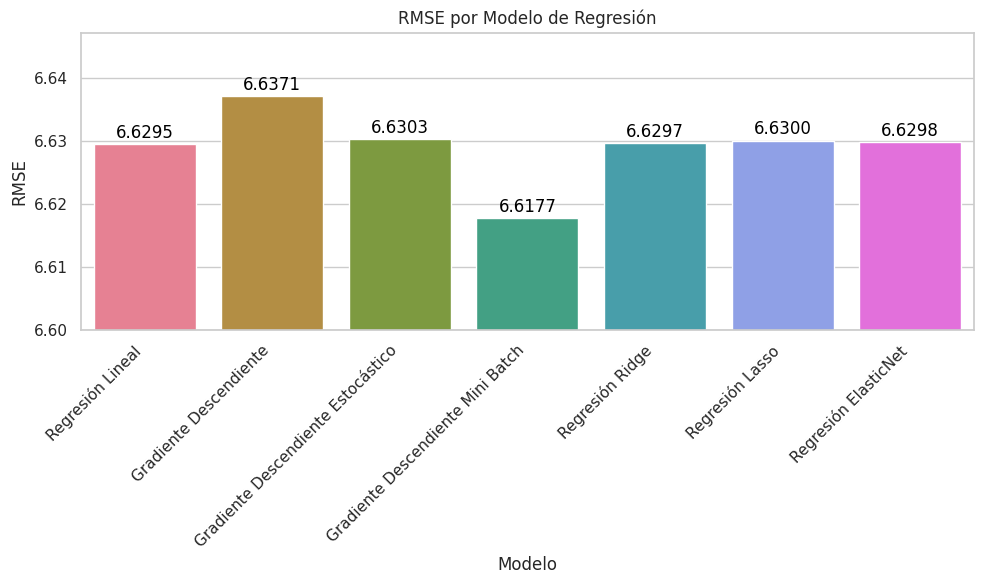

In [179]:
# Crear el gráfico de barras con la paleta 'husl' y etiquetas
plt.figure(figsize=(10, 6))
barplot = sns.barplot(x="Modelo", y="RMSE", data=df_rmse, palette="husl")

# Establecer el límite inferior del eje Y en 6.625
plt.ylim(6.6, max(df_rmse["RMSE"]) + 0.01)

# Agregar etiquetas a las barras
for index, row in df_rmse.iterrows():
    barplot.text(row.name, row.RMSE + 0.001, f'{row.RMSE:.4f}', color='black', ha="center")

plt.xticks(rotation=45, ha='right')
plt.title("RMSE por Modelo de Regresión")
plt.xlabel("Modelo")
plt.ylabel("RMSE")
plt.tight_layout()

# Mostrar el gráfico
plt.show()
